# Finance and Risk Analytics - Capstone Project
####                                                                                                                                                              Santapuri Jayavardhan Rayudu

# Problem Statement
#### In the recent past, the industry of wealth management has seen a lot of growth. Every individual or business actively searches for opportunities to get the maximum returns. However, in most of the cases, they either lack the skills to identify the right investment opportunity, or there is a shortage of time for finding these opportunities. Hence, this gave rise to the dedicated individuals who perform this task on behalf of the investors for a commission - Portfolio managers.
####                    A portfolio manager makes investment decisions and carries out other related activities on behalf of vested investors. They work with a team of analysts and researchers, and their main objective is to realise the needs of the investor and suggest a suitable portfolio that meets all the expectations. They are responsible for establishing the best investment strategy, selecting appropriate investments along with the right allocation. However, in doing so, they face a lot of competition in the form of other portfolio managers and rival firms. Therefore, the portfolio manager has to use the available resources to provide the best solution to the investor.

# To Do
#### Consider yourself working for an associate at an investment firm that manages accounts for private clients. Your role requires you to analyse a portfolio of stocks to provide consultation on investment management based on client’s requirement.
#### Your task is to provide consultation to two different investors, Mr Patrick Jyenger and Mr Peter Jyenger based on their requirements and financial objectives. You can refer to the elements mentioned in the video to develop the investor persona.


# Importing Libraries

In [1]:
#Data Analysis & Data wrangling Libraries
import numpy as np
import pandas as pd
from collections import Counter
from functools import reduce
from datetime import datetime
from scipy import stats


#Visualization Librarues
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
%matplotlib inline

# Plot Style
sns.set_context("paper")
style.use('fivethirtyeight')

# Machine Learning Libraries

#Sci-kit learn libraries

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error


#statsmodel libraries
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from pylab import rcParams

In [2]:
# Supress the Warnings
import warnings
warnings.filterwarnings('ignore')

# Lets take a look at Annexure now

In [3]:
Annexure= pd.read_csv('Annexure-I.csv')

In [4]:
Annexure

,Ticker,Industry,Company Name
0,AAL,Aviation,American Airlines Group Inc
1,ALGT,Aviation,Allegiant Travel Company
2,ALK,Aviation,Alaska Air Group Inc
3,DAL,Aviation,Delta Air Lines Inc
4,HA,Aviation,Hawaiian Holdings Inc
5,LUV,Aviation,Southwest Airlines Co
6,BCS,Finance,Barclays
7,CS,Finance,Credit Suisse
8,DB,Finance,Deutsche Bank
9,GS,Finance,Goldman Sachs


### We are provided with 24 stocks from 5 different sectors namely Aviation, Finance, Healthcare, Pharmaceuticals and Technology...

### Let us import the data sets of all the stocks from the csv files provided...

In [5]:
## AVIATION STOCKS
American_Airlines = pd.read_csv("AAL.csv")
Allegiant_Travel = pd.read_csv("ALGT.csv")
Alaska_Air = pd.read_csv("ALk.csv")
Delta_AirLines = pd.read_csv("DAL.csv")
Hawaiian_Holdings = pd.read_csv("HA.csv")
Southwest_Airlines = pd.read_csv("LUV.csv")

## FINANCE STOCKS
Barclays = pd.read_csv("BCS.csv")
Credit_Suisse = pd.read_csv("CS.csv")
Deutsche_Bank = pd.read_csv("DB.csv")
Goldman_Sachs = pd.read_csv("GS.csv")
Morgan_Stanley = pd.read_csv("MS.csv")
Wells_Fargo = pd.read_csv("WFC.csv")

## HEALTHCARE STOCKS
Johnson_and_Johnson = pd.read_csv("JNJ.csv")
Merck_and_CO = pd.read_csv("MRK.csv")
Pfizer = pd.read_csv("PFE.csv")
UnitedHealthGroup = pd.read_csv("UNH.csv")

## PHARMACEUTICAL STOCKS
Bausch_Health = pd.read_csv("BHC.csv")
Roche_Holding = pd.read_csv("RHHBY.csv")

## TECHNOLOGY STOCKS
Apple = pd.read_csv("AAPL.csv")
Amazon = pd.read_csv("AMZN.csv")
Facebook = pd.read_csv("FB.csv")
Alphabet = pd.read_csv("GOOG.csv")
IBM = pd.read_csv("IBM.csv")
Microsoft = pd.read_csv("MSFT.csv")

#s&p500 Index

SP500 = pd.read_csv("S&P500.csv")

In [6]:
# let's look at a stock dataset.

SP500.head(10)

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000
1,04-10-2010,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000
2,05-10-2010,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000
3,06-10-2010,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000
4,07-10-2010,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000
5,08-10-2010,1158.359985,1167.729980,1155.579956,1165.150024,1165.150024,3871420000
6,11-10-2010,1165.319946,1168.680054,1162.020020,1165.319946,1165.319946,2505900000
7,12-10-2010,1164.280029,1172.579956,1155.709961,1169.770020,1169.770020,4076170000
8,13-10-2010,1171.319946,1184.380005,1171.319946,1178.099976,1178.099976,4969410000
9,14-10-2010,1177.819946,1178.890015,1166.709961,1173.810059,1173.810059,4969410000


In [7]:
# Among all the columns, Date and Close are the column which we need to focus...
#Let's replace all the close values with the stock name... so that we can use it when we merge all the data

American_Airlines = American_Airlines.rename(columns = {'Open': 'AAL_Open', 'High': 'AAL_High','Low': 'AAL_Low','Close': 'AAL','Adj Close': 'AAL_Adj Close','Volume': 'AAL_Volume'}, inplace = False)
Allegiant_Travel = Allegiant_Travel.rename(columns = {'Open': 'ALGT_Open', 'High': 'ALGT_High','Low': 'ALGT_Low','Close': 'ALGT','Adj Close': 'ALGT_Adj Close','Volume': 'ALGT_Volume'}, inplace = False)
Alaska_AirLk = Alaska_Air.rename(columns = {'Open': 'ALk_Open', 'High': 'ALk_High','Low': 'ALk_Low','Close': 'ALk','Adj Close': 'ALk_Adj Close','Volume': 'ALk_Volume'}, inplace = False)
Delta_AirLines = Delta_AirLines.rename(columns = {'Open': 'DAL_Open', 'High': 'DAL_High','Low': 'DAL_Low','Close': 'DAL','Adj Close': 'DAL_Adj Close','Volume': 'DAL_Volume'}, inplace = False)
Hawaiian_Holdings = Hawaiian_Holdings.rename(columns = {'Open': 'HA_Open', 'High': 'HA_High','Low': 'HA_Low','Close': 'HA','Adj Close': 'HAL_Adj Close','Volume': 'HAL_Volume'}, inplace = False)
Southwest_Airlines = Southwest_Airlines.rename(columns = {'Open': 'LUV_Open', 'High': 'LUV_High','Low': 'LUV_Low','Close': 'LUV','Adj Close': 'LUV_Adj Close','Volume': 'LUV_Volume'}, inplace = False)

Barclays = Barclays.rename(columns = {'Open': 'BCS_Open', 'High': 'BCS_High','Low': 'BCS_Low','Close': 'BCS','Adj Close': 'BCS_Adj Close','Volume': 'BCS_Volume'}, inplace = False)
Credit_Suisse = Credit_Suisse.rename(columns = {'Open': 'CS_Open', 'High': 'CS_High','Low': 'CS_Low','Close': 'CS','Adj Close': 'CS_Adj Close','Volume': 'CS_Volume'}, inplace = False)
Deutsche_Bank= Deutsche_Bank.rename(columns = {'Open': 'DB_Open', 'High': 'DB_High','Low': 'DB_Low','Close': 'DB','Adj Close': 'DB_Adj Close','Volume': 'DB_Volume'}, inplace = False)
Goldman_Sachs = Goldman_Sachs.rename(columns = {'Open': 'GS_Open', 'High': 'GS_High','Low': 'GS_Low','Close': 'GS','Adj Close': 'GS_Adj Close','Volume': 'GS_Volume'}, inplace = False)
Morgan_Stanley = Morgan_Stanley.rename(columns = {'Open': 'MS_Open', 'High': 'MS_High','Low': 'MS_Low','Close': 'MS','Adj Close': 'MS_Adj Close','Volume': 'MS_Volume'}, inplace = False)
Wells_Fargo = Wells_Fargo.rename(columns = {'Open': 'WFC_Open', 'High': 'WFC_High','Low': 'WFC_Low','Close': 'WFC','Adj Close': 'WFC_Adj Close','Volume': 'WFC_Volume'}, inplace = False)

Johnson_and_Johnson = Johnson_and_Johnson.rename(columns = {'Open': 'JNJ_Open', 'High': 'JNJ_High','Low': 'JNJ_Low','Close': 'JNJ','Adj Close': 'JNJ_Adj Close','Volume': 'JNJ_Volume'}, inplace = False)
Merck_and_CO = Merck_and_CO.rename(columns = {'Open': 'MRK_Open', 'High': 'MRK_High','Low': 'MRK_Low','Close': 'MRK','Adj Close': 'MRK_Adj Close','Volume': 'MRK_Volume'}, inplace = False)
Pfizer = Pfizer.rename(columns = {'Open': 'PFE_Open', 'High': 'PFE_High','Low': 'PFE_Low','Close': 'PFE','Adj Close': 'PFE_Adj Close','Volume': 'PFE_Volume'}, inplace = False)
UnitedHealthGroup = UnitedHealthGroup.rename(columns = {'Open': 'UNH_Open', 'High': 'UNH_High','Low': 'UNH_Low','Close': 'UNH','Adj Close': 'UNH_Adj Close','Volume': 'UNH_Volume'}, inplace = False)

Bausch_Health = Bausch_Health.rename(columns = {'Open': 'BHC_Open', 'High': 'BHC_High','Low': 'BHC_Low','Close': 'BHC','Adj Close': 'BHC_Adj Close','Volume': 'BHC_Volume'}, inplace = False)
Roche_Holding = Roche_Holding.rename(columns = {'Open': 'RHHBY_Open', 'High': 'RHHBY_High','Low': 'RHHBY_Low','Close': 'RHHBY','Adj Close': 'RHHBY_Adj Close','Volume': 'RHHBY_Volume'}, inplace = False)

Apple = Apple.rename(columns = {'Open': 'AAPL_Open', 'High': 'AAPL_High','Low': 'AAPL_Low','Close': 'AAPL','Adj Close': 'AAPL_Adj Close','Volume': 'AAPL_Volume'}, inplace = False)
Amazon = Amazon.rename(columns = {'Open': 'AMZN_Open', 'High': 'AMZN_High','Low': 'AMZN_Low','Close': 'AMZN','Adj Close': 'AMZN_Adj Close','Volume': 'AMZN_Volume'}, inplace = False)
Facebook = Facebook.rename(columns = {'Open': 'FB_Open', 'High': 'FB_High','Low': 'FB_Low','Close': 'FB','Adj Close': 'FB_Adj Close','Volume': 'FB_Volume'}, inplace = False)
Alphabet = Alphabet.rename(columns = {'Open': 'GOOG_Open', 'High': 'GOOG_High','Low': 'GOOG_Low','Close': 'GOOG','Adj Close': 'GOOG_Adj Close','Volume': 'GOOG_Volume'}, inplace = False)
IBM = IBM.rename(columns = {'Open': 'IBM_Open', 'High': 'IBM_High','Low': 'IBM_Low','Close': 'IBM','Adj Close': 'IBM_Adj Close','Volume': 'IBM_Volume'}, inplace = False)
Microsoft = Microsoft.rename(columns = {'Open': 'MSFT_Open', 'High': 'MSFT_High','Low': 'MSFT_Low','Close': 'MSFT','Adj Close': 'MSFT_Adj Close','Volume': 'MSFT_Volume'}, inplace = False)

SP500 = SP500.rename(columns = {'Open': 'S&P500_Open', 'High': 'S&P500_High','Low': 'S&P500_Low','Close': 'S&P500','Adj Close': 'S&P500_Adj Close','Volume': 'S&P500_Volume'}, inplace = False)


In [8]:
SP500.head()

,Date,S&P500_Open,S&P500_High,S&P500_Low,S&P500,S&P500_Adj Close,S&P500_Volume
0,01-10-2010,1143.489990,1150.300049,1139.420044,1146.239990,1146.239990,4298910000
1,04-10-2010,1144.959961,1148.160034,1131.869995,1137.030029,1137.030029,3604110000
2,05-10-2010,1140.680054,1162.760010,1140.680054,1160.750000,1160.750000,4068840000
3,06-10-2010,1159.810059,1162.329956,1154.849976,1159.969971,1159.969971,4073160000
4,07-10-2010,1161.569946,1163.869995,1151.410034,1158.060059,1158.060059,3910550000


In [9]:
# As mentioned above we need only the Date and close columns... Let's create a subset with just these two columns now...

# Aviation stocks
AAL = American_Airlines[['Date','AAL']]
ALGT = Allegiant_Travel[['Date','ALGT']]
ALK = Alaska_AirLk[['Date','ALk']]
DAL = Delta_AirLines[['Date','DAL']]
HA = Hawaiian_Holdings[['Date','HA']]
LUV = Southwest_Airlines[['Date','LUV']]

# Finance stocks
BCS = Barclays[['Date','BCS']]
CS = Credit_Suisse[['Date','CS']]
DB = Deutsche_Bank[['Date','DB']]
GS = Goldman_Sachs[['Date','GS']]
MS = Morgan_Stanley[['Date','MS']]
WFC = Wells_Fargo[['Date','WFC']]

# Pharma_healthcare stocks
BHC = Bausch_Health[['Date','BHC']]
JNJ = Johnson_and_Johnson[['Date','JNJ']]
MRK = Merck_and_CO[['Date','MRK']]
PFE = Pfizer[['Date','PFE']]
RHHBY = Roche_Holding[['Date','RHHBY']]
UNH = UnitedHealthGroup[['Date','UNH']]

# Technology stocks
AAPL = Apple[['Date','AAPL']]
AMZN = Amazon[['Date','AMZN']]
FB = Facebook[['Date','FB']]
GOOG = Alphabet[['Date','GOOG']]
IBM = IBM[['Date','IBM']]
MSFT = Microsoft[['Date','MSFT']]

# S&P500 index
SP500 = SP500[['Date','S&P500']]

In [10]:
data = [SP500, AAL, ALGT, ALK, DAL, HA, LUV, BCS, CS, DB, GS, MS, WFC, BHC, JNJ, MRK, PFE, RHHBY, UNH, AAPL, AMZN, FB, GOOG, IBM, MSFT]

In [11]:
# Let us merge all the above datasets now..
data_final = reduce(lambda left,right: pd.merge(left,right,on='Date'), data)

In [12]:
data_final.head()

,Date,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,...,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
0,18-05-2012,1295.219971,10.06,62.310001,16.170000,10.14,5.28,8.15,10.285714,19.169922,...,37.820000,22.570000,20.160000,53.990002,18.942142,213.850006,38.230000,299.078979,195.880005,29.270000
1,21-05-2012,1315.989990,10.71,62.660000,16.379999,10.58,5.32,8.34,10.672812,19.541016,...,37.599998,22.540001,20.389999,55.549999,20.045713,218.110001,34.029999,305.908386,197.759995,29.750000
2,22-05-2012,1316.630005,10.62,62.349998,16.225000,10.54,5.23,8.27,10.857142,19.863281,...,37.459999,22.370001,20.430000,55.720001,19.891787,215.330002,31.000000,299.278229,196.820007,29.760000
3,23-05-2012,1318.859985,11.00,62.990002,16.115000,10.74,5.38,8.36,10.737328,19.765625,...,37.340000,22.090000,20.075001,55.360001,20.377142,217.279999,32.000000,303.592072,196.119995,29.110001
4,24-05-2012,1320.680054,12.16,64.250000,16.920000,11.27,5.68,8.74,10.746544,19.658203,...,37.599998,22.139999,19.855000,56.220001,20.190001,215.240005,33.029999,300.702881,196.089996,29.070000


In [13]:
# We can see the max rows & columns with the help of below code
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [14]:
data_final.head()

,Date,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
0,18-05-2012,1295.219971,10.06,62.310001,16.170000,10.14,5.28,8.15,10.285714,19.169922,34.370228,95.489998,13.35,30.940001,47.029999,63.349998,37.820000,22.570000,20.160000,53.990002,18.942142,213.850006,38.230000,299.078979,195.880005,29.270000
1,21-05-2012,1315.989990,10.71,62.660000,16.379999,10.58,5.32,8.34,10.672812,19.541016,35.505726,96.510002,13.19,31.400000,47.189999,63.470001,37.599998,22.540001,20.389999,55.549999,20.045713,218.110001,34.029999,305.908386,197.759995,29.750000
2,22-05-2012,1316.630005,10.62,62.349998,16.225000,10.54,5.23,8.27,10.857142,19.863281,35.410305,97.529999,13.31,31.670000,47.779999,63.520000,37.459999,22.370001,20.430000,55.720001,19.891787,215.330002,31.000000,299.278229,196.820007,29.760000
3,23-05-2012,1318.859985,11.00,62.990002,16.115000,10.74,5.38,8.36,10.737328,19.765625,35.381680,98.040001,13.37,31.740000,46.650002,63.270000,37.340000,22.090000,20.075001,55.360001,20.377142,217.279999,32.000000,303.592072,196.119995,29.110001
4,24-05-2012,1320.680054,12.16,64.250000,16.920000,11.27,5.68,8.74,10.746544,19.658203,34.828243,96.860001,13.31,31.809999,48.040001,63.099998,37.599998,22.139999,19.855000,56.220001,20.190001,215.240005,33.029999,300.702881,196.089996,29.070000


In [15]:
# let's check the shape of the dataframe
data_final.shape

(2106, 26)

In [16]:
data_final.describe()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000
mean,2273.892283,33.552859,133.642911,56.696432,40.479141,26.177854,38.977840,11.822157,19.199134,23.418093,188.979198,36.923936,47.520798,65.469117,113.375522,61.404653,33.580147,32.943830,159.649582,37.230219,984.016083,119.599425,816.281595,159.660071,76.196852
std,534.027978,13.036814,35.668011,20.649972,14.673069,14.808009,16.480813,3.736298,7.109165,13.237359,38.409585,10.838003,8.998725,61.730865,23.369759,12.786464,4.930604,4.905682,81.072224,20.480593,749.076388,63.839134,337.218474,25.113899,47.698636
min,1278.040039,9.040000,62.259998,16.115000,8.550000,5.220000,8.150000,3.840000,6.670000,5.480000,91.000000,12.360000,22.530001,8.510000,61.779999,37.180000,21.600000,19.430000,51.000000,13.947500,208.220001,17.730000,278.481171,94.769997,26.370001
25%,1895.847473,22.792500,109.180000,38.462499,30.582500,13.132500,26.875001,8.892500,13.192500,11.220000,162.255001,29.365001,43.627500,20.567500,97.940002,52.980000,30.282501,30.526250,81.502500,23.573749,331.909996,68.429998,536.690002,141.279999,41.272500
50%,2132.765014,36.365000,136.060005,62.570002,45.315000,25.920001,41.850001,10.940000,16.304296,18.740000,189.885002,37.295000,49.770000,28.490000,114.684997,58.965000,33.590000,32.514999,138.119995,30.137500,743.445007,118.680000,759.674988,155.095001,56.494999
75%,2736.487549,43.465001,159.899994,69.169998,51.552501,38.437501,53.024999,15.387500,26.477500,34.647500,219.892494,45.657500,54.097499,105.919998,132.887500,68.764998,36.340000,35.700001,240.174996,45.233126,1643.132507,173.980003,1101.962494,182.865006,104.955002
max,3580.840088,58.470001,233.979996,100.239998,63.160000,60.299999,66.290001,19.580000,33.840000,51.898853,273.380005,58.910000,65.930000,262.519989,155.509995,92.040001,46.230000,46.840000,323.700012,134.179993,3531.449951,303.910004,1728.280029,215.800003,231.649994


In [17]:
data_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2106 entries, 0 to 2105
Data columns (total 26 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2106 non-null   object 
 1   S&P500  2106 non-null   float64
 2   AAL     2106 non-null   float64
 3   ALGT    2106 non-null   float64
 4   ALk     2106 non-null   float64
 5   DAL     2106 non-null   float64
 6   HA      2106 non-null   float64
 7   LUV     2106 non-null   float64
 8   BCS     2106 non-null   float64
 9   CS      2106 non-null   float64
 10  DB      2106 non-null   float64
 11  GS      2106 non-null   float64
 12  MS      2106 non-null   float64
 13  WFC     2106 non-null   float64
 14  BHC     2106 non-null   float64
 15  JNJ     2106 non-null   float64
 16  MRK     2106 non-null   float64
 17  PFE     2106 non-null   float64
 18  RHHBY   2106 non-null   float64
 19  UNH     2106 non-null   float64
 20  AAPL    2106 non-null   float64
 21  AMZN    2106 non-null   float64
 22  

### Everything seem's fine but date should be in date time format instead of Object

In [18]:
# lets change the date column to datetime format
data_final["Date"]= pd.to_datetime(data_final["Date"], format='%d-%m-%Y')

In [19]:
data_final.dtypes

Date      datetime64[ns]
S&P500           float64
AAL              float64
ALGT             float64
ALk              float64
DAL              float64
HA               float64
LUV              float64
BCS              float64
CS               float64
DB               float64
GS               float64
MS               float64
WFC              float64
BHC              float64
JNJ              float64
MRK              float64
PFE              float64
RHHBY            float64
UNH              float64
AAPL             float64
AMZN             float64
FB               float64
GOOG             float64
IBM              float64
MSFT             float64
dtype: object

Now date is shown in datetime format... Lets move further

In [20]:
#lets convert the datecolumn as index for our reference
data_final = data_final.set_index('Date')

#lets check the data columnn
data_final.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2012-05-18,1295.219971,10.06,62.310001,16.170000,10.14,5.28,8.15,10.285714,19.169922,34.370228,95.489998,13.35,30.940001,47.029999,63.349998,37.820000,22.570000,20.160000,53.990002,18.942142,213.850006,38.230000,299.078979,195.880005,29.270000
2012-05-21,1315.989990,10.71,62.660000,16.379999,10.58,5.32,8.34,10.672812,19.541016,35.505726,96.510002,13.19,31.400000,47.189999,63.470001,37.599998,22.540001,20.389999,55.549999,20.045713,218.110001,34.029999,305.908386,197.759995,29.750000
2012-05-22,1316.630005,10.62,62.349998,16.225000,10.54,5.23,8.27,10.857142,19.863281,35.410305,97.529999,13.31,31.670000,47.779999,63.520000,37.459999,22.370001,20.430000,55.720001,19.891787,215.330002,31.000000,299.278229,196.820007,29.760000
2012-05-23,1318.859985,11.00,62.990002,16.115000,10.74,5.38,8.36,10.737328,19.765625,35.381680,98.040001,13.37,31.740000,46.650002,63.270000,37.340000,22.090000,20.075001,55.360001,20.377142,217.279999,32.000000,303.592072,196.119995,29.110001
2012-05-24,1320.680054,12.16,64.250000,16.920000,11.27,5.68,8.74,10.746544,19.658203,34.828243,96.860001,13.31,31.809999,48.040001,63.099998,37.599998,22.139999,19.855000,56.220001,20.190001,215.240005,33.029999,300.702881,196.089996,29.070000


In [21]:
data_final.tail()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-24,3246.590088,11.77,121.500000,35.700001,29.010000,12.40,36.860001,4.75,9.62,8.11,195.110001,46.610001,23.320000,15.22,144.669998,83.150002,35.759998,44.700001,292.660004,108.220001,3019.790039,249.529999,1428.290039,118.089996,203.190002
2020-09-25,3298.459961,12.29,123.760002,36.700001,29.780001,12.80,37.099998,4.70,9.48,8.00,194.949997,47.040001,23.639999,15.30,145.660004,82.930000,36.049999,44.820000,302.500000,112.279999,3095.129883,254.820007,1444.959961,118.949997,207.820007
2020-09-28,3351.600098,12.76,127.110001,37.540001,31.340000,13.38,38.240002,4.99,9.90,8.43,199.070007,48.380001,23.820000,15.27,147.110001,82.760002,36.389999,44.110001,303.230011,114.959999,3174.050049,256.820007,1464.520020,121.730003,209.440002
2020-09-29,3335.469971,12.25,121.089996,36.669998,30.610001,12.86,37.610001,4.96,9.83,8.27,196.789993,47.240002,23.260000,14.88,147.059998,81.900002,36.169998,43.369999,304.149994,114.089996,3144.879883,261.790009,1469.329956,120.940002,207.259995
2020-09-30,3363.000000,12.29,119.800003,36.630001,30.580000,12.89,37.500000,5.01,9.97,8.40,200.970001,48.349998,23.510000,15.54,148.880005,82.949997,36.700001,42.810001,311.769989,115.809998,3148.729980,261.899994,1469.599976,121.669998,210.330002


In [22]:
# We are given a lead to predict the 5 years data by using given past five years. So, we need to take the data of past five years...
# So, we need the data from Oct 1, 2015 till Sept 30, 2020...
data = data_final['2015-10-01':]
data.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,39.200001,217.979996,80.230003,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,179.600006,93.169998,49.369999,31.840000,33.220001,116.610001,27.395000,520.719971,90.949997,611.289978,143.589996,44.610001
2015-10-02,1951.359985,38.630001,215.589996,79.260002,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,182.320007,93.930000,50.139999,33.080002,33.320000,118.830002,27.594999,532.539978,92.070000,626.909973,144.580002,45.570000
2015-10-05,1987.050049,40.189999,216.059998,80.910004,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,163.460007,94.760002,51.230000,33.480000,33.439999,119.650002,27.695000,543.679993,94.010002,641.469971,149.039993,46.630001
2015-10-06,1979.920044,38.130001,208.600006,74.529999,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,166.000000,93.419998,49.799999,32.790001,33.529999,116.050003,27.827499,537.479980,92.800003,645.440002,148.779999,46.750000
2015-10-07,1995.829956,39.310001,213.839996,75.970001,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,169.830002,94.980003,50.950001,33.290001,32.549999,116.430000,27.695000,541.940002,92.400002,642.359985,150.089996,46.799999


### So, we got our final data... Let's further proceed to data cleaning to check for any null values...

In [23]:
data.isnull().sum()

S&P500    0
AAL       0
ALGT      0
ALk       0
DAL       0
HA        0
LUV       0
BCS       0
CS        0
DB        0
GS        0
MS        0
WFC       0
BHC       0
JNJ       0
MRK       0
PFE       0
RHHBY     0
UNH       0
AAPL      0
AMZN      0
FB        0
GOOG      0
IBM       0
MSFT      0
dtype: int64

### We have zero null values... so we need not clean any thing.... We can consider this as our final data... We can save it so that we can use it for visualization in tableau...

In [24]:
data.to_csv('data.csv')

# We have now completed the Pre-Processing step... Now, let's move further to Data Exploration

In [25]:
data.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,39.200001,217.979996,80.230003,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,179.600006,93.169998,49.369999,31.840000,33.220001,116.610001,27.395000,520.719971,90.949997,611.289978,143.589996,44.610001
2015-10-02,1951.359985,38.630001,215.589996,79.260002,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,182.320007,93.930000,50.139999,33.080002,33.320000,118.830002,27.594999,532.539978,92.070000,626.909973,144.580002,45.570000
2015-10-05,1987.050049,40.189999,216.059998,80.910004,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,163.460007,94.760002,51.230000,33.480000,33.439999,119.650002,27.695000,543.679993,94.010002,641.469971,149.039993,46.630001
2015-10-06,1979.920044,38.130001,208.600006,74.529999,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,166.000000,93.419998,49.799999,32.790001,33.529999,116.050003,27.827499,537.479980,92.800003,645.440002,148.779999,46.750000
2015-10-07,1995.829956,39.310001,213.839996,75.970001,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,169.830002,94.980003,50.950001,33.290001,32.549999,116.430000,27.695000,541.940002,92.400002,642.359985,150.089996,46.799999


### We are asked to show visualization to both the original data and the normalized data tooo....
### We can normalize the data by dividing all the values in cloumn to the first value in column...

Let's create a list of the first row of the data frame, so that we can divide this with each individual column in the dataframe to normalize....

In [26]:
sub = list(data.iloc[0])
sub

[1923.819946,
 39.200001,
 217.979996,
 80.230003,
 45.41,
 24.73,
 38.41,
 15.01,
 24.09,
 26.52,
 176.020004,
 31.5,
 51.439999,
 179.600006,
 93.16999799999999,
 49.369999,
 31.84,
 33.220001,
 116.610001,
 27.395,
 520.719971,
 90.949997,
 611.289978,
 143.58999599999999,
 44.610001000000004]

In [27]:
norm_data = data.div(sub, axis='columns')
norm_data

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.014315,0.985459,0.989036,0.987910,0.988108,0.981804,0.999219,1.025316,1.022831,1.023379,1.005624,0.997778,0.996501,1.015145,1.008157,1.015597,1.038945,1.003010,1.019038,1.007301,1.022699,1.012314,1.025553,1.006895,1.021520
2015-10-05,1.032867,1.025255,0.991192,1.008476,1.034133,1.031136,1.023171,1.039307,1.044417,1.063348,1.026588,1.025079,1.018857,0.910134,1.017066,1.037675,1.051508,1.006622,1.026070,1.010951,1.044093,1.033645,1.049371,1.037955,1.045281
2015-10-06,1.029161,0.972704,0.956969,0.928954,0.992953,0.980590,0.989326,1.035976,1.053549,1.070890,1.024429,1.027302,1.011470,0.924276,1.002683,1.008710,1.029837,1.009332,0.995198,1.015788,1.032186,1.020341,1.055866,1.036145,1.047971
2015-10-07,1.037431,1.002806,0.981007,0.946903,1.012773,0.993126,1.007810,1.047968,1.051059,1.085596,1.035280,1.045397,1.014580,0.945601,1.019427,1.032003,1.045540,0.979831,0.998456,1.010951,1.040751,1.015943,1.050827,1.045268,1.049092
2015-10-08,1.046579,1.013776,0.975594,0.944285,1.012112,1.054994,1.009112,1.053298,1.018265,1.070513,1.028690,1.047302,1.021384,0.953062,1.020500,1.033421,1.039259,1.000903,0.995455,0.999270,1.023890,1.016713,1.045592,1.060520,1.063663
2015-10-09,1.047338,1.082143,0.998624,0.946279,1.039639,1.103518,1.039833,1.046636,1.028227,1.106335,1.018009,1.038730,1.013608,0.979621,1.023613,1.032003,1.043970,0.989163,1.022811,1.023179,1.036642,1.025179,1.052872,1.061286,1.056041
2015-10-12,1.048674,1.118367,1.045325,0.972080,1.068047,1.137485,1.073158,1.047968,1.041096,1.098793,1.023918,1.041270,1.014386,0.967984,1.030267,1.027142,1.043342,0.993377,1.050596,1.018434,1.056595,1.036394,1.057878,1.052580,1.053575
2015-10-13,1.041516,1.107398,1.004358,0.921351,1.051090,1.143955,1.062744,1.009993,1.028643,1.085219,1.028122,1.035238,1.008165,0.927060,1.024471,1.002026,1.035804,0.998796,1.063288,1.020168,1.054117,1.034854,1.067088,1.041995,1.051110


In [28]:
norm_data.shape

(1259, 25)

In [29]:
data.shape

(1259, 25)

In [30]:
norm_data.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.014315,0.985459,0.989036,0.987910,0.988108,0.981804,0.999219,1.025316,1.022831,1.023379,1.005624,0.997778,0.996501,1.015145,1.008157,1.015597,1.038945,1.003010,1.019038,1.007301,1.022699,1.012314,1.025553,1.006895,1.021520
2015-10-05,1.032867,1.025255,0.991192,1.008476,1.034133,1.031136,1.023171,1.039307,1.044417,1.063348,1.026588,1.025079,1.018857,0.910134,1.017066,1.037675,1.051508,1.006622,1.026070,1.010951,1.044093,1.033645,1.049371,1.037955,1.045281
2015-10-06,1.029161,0.972704,0.956969,0.928954,0.992953,0.980590,0.989326,1.035976,1.053549,1.070890,1.024429,1.027302,1.011470,0.924276,1.002683,1.008710,1.029837,1.009332,0.995198,1.015788,1.032186,1.020341,1.055866,1.036145,1.047971
2015-10-07,1.037431,1.002806,0.981007,0.946903,1.012773,0.993126,1.007810,1.047968,1.051059,1.085596,1.035280,1.045397,1.014580,0.945601,1.019427,1.032003,1.045540,0.979831,0.998456,1.010951,1.040751,1.015943,1.050827,1.045268,1.049092


In [31]:
norm_data.describe()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000
mean,1.355860,0.928417,0.663928,0.832961,1.061911,1.426501,1.289275,0.620615,0.586583,0.512571,1.178504,1.354100,0.953297,0.155166,1.385113,1.377944,1.139787,1.008767,1.827675,1.718569,2.740418,1.798913,1.702610,1.000451,2.290632
std,0.205185,0.293035,0.114260,0.191374,0.206526,0.458989,0.229963,0.145714,0.134469,0.200711,0.179518,0.274931,0.178161,0.139168,0.146557,0.233967,0.119812,0.140406,0.509643,0.766308,1.283531,0.440305,0.395231,0.105605,1.025743
min,0.950754,0.230612,0.303835,0.293656,0.422594,0.348969,0.621453,0.255829,0.276878,0.206637,0.766788,0.688571,0.437986,0.047383,1.000000,0.984201,0.894786,0.794401,0.936712,0.824420,0.925776,1.000000,1.000000,0.660004,1.000000
25%,1.177077,0.774490,0.596729,0.768229,0.997027,1.124343,1.104270,0.540306,0.497924,0.327866,1.040649,1.213492,0.920004,0.093708,1.284104,1.188171,1.051036,0.922035,1.376983,1.088565,1.571132,1.420011,1.304553,0.935476,1.404618
50%,1.380743,0.968112,0.660611,0.824505,1.108566,1.492115,1.350690,0.621586,0.570361,0.507919,1.191115,1.397460,0.994168,0.123441,1.405817,1.298157,1.123430,0.964479,1.943573,1.568261,2.880627,1.838813,1.727184,1.004527,2.105357
75%,1.501318,1.150638,0.745894,0.944347,1.205571,1.732511,1.456261,0.718188,0.643421,0.657617,1.316157,1.553810,1.061042,0.141954,1.497209,1.607859,1.203832,1.037628,2.227510,1.966372,3.512041,2.054920,1.957238,1.068459,3.031159
max,1.861318,1.491582,1.045325,1.249408,1.390883,2.438334,1.725853,1.053298,1.077626,1.159502,1.553119,1.870159,1.281687,1.015145,1.669099,1.864290,1.451947,1.409994,2.775920,4.897974,6.781860,3.341506,2.827267,1.267150,5.192782


In [32]:
norm_data.to_csv('norm_data.csv')

### Aviation Sector

In [33]:
#Aviation Stocks

Aviation=norm_data[['S&P500','ALGT','AAL','ALk','DAL','HA','LUV']]

Aviation.head()

,S&P500,ALGT,AAL,ALk,DAL,HA,LUV
Date,,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.014315,0.989036,0.985459,0.987910,0.988108,0.981804,0.999219
2015-10-05,1.032867,0.991192,1.025255,1.008476,1.034133,1.031136,1.023171
2015-10-06,1.029161,0.956969,0.972704,0.928954,0.992953,0.980590,0.989326
2015-10-07,1.037431,0.981007,1.002806,0.946903,1.012773,0.993126,1.007810


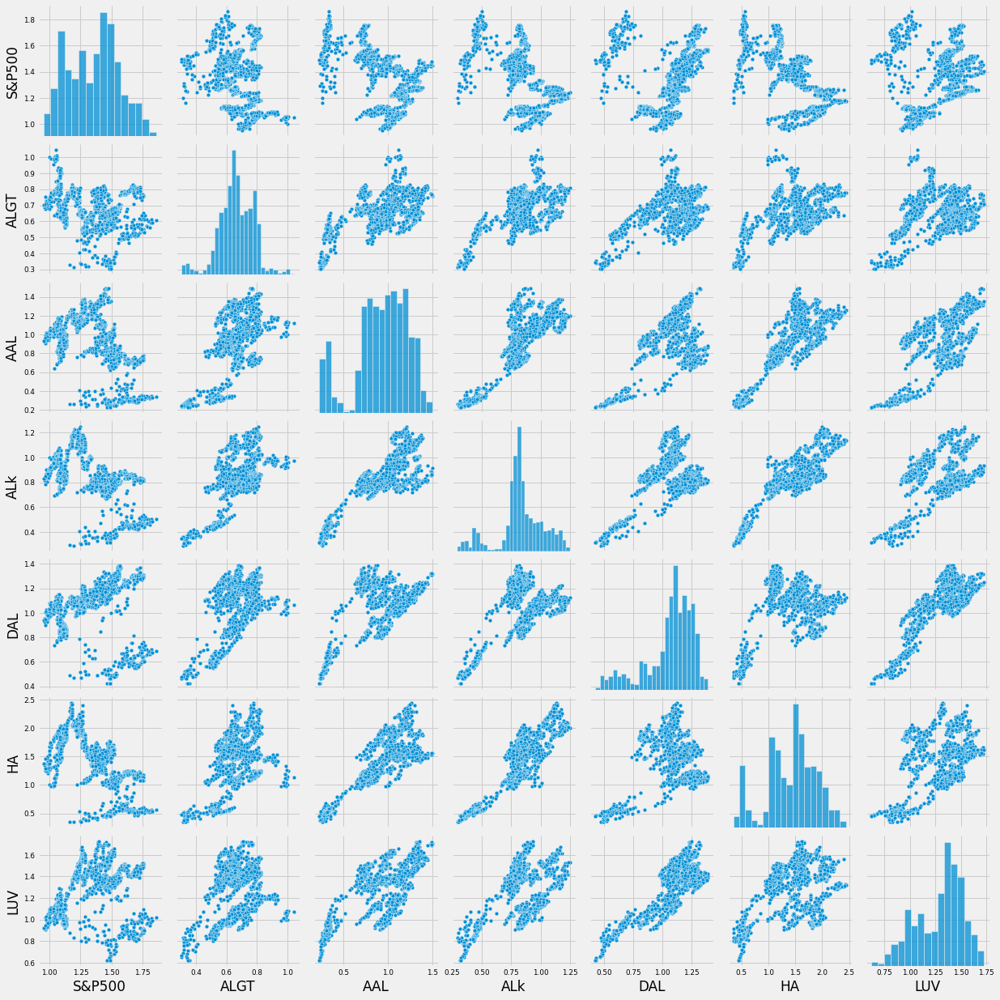

In [34]:
sns.pairplot(Aviation, kind = 'scatter')
plt.ioff()

<AxesSubplot:title={'center':'Aviation_Sector'}>

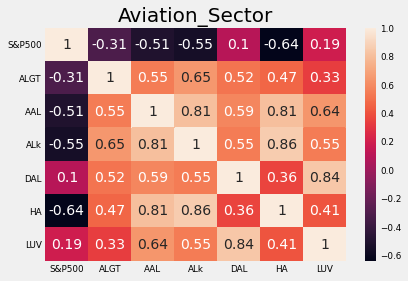

In [35]:
Aviation_Corr = sns.heatmap(Aviation.corr(), annot=True)
plt.title('Aviation_Sector', fontsize = 20)
Aviation_Corr

HA, AAL & ALK have good positive correlation.
LUV and DAL too have same result... 

### Finance Sector

In [36]:
# Finance Stocks

Finance=norm_data[['S&P500','BCS','CS','DB','GS','MS','WFC']]

Finance.head()

,S&P500,BCS,CS,DB,GS,MS,WFC
Date,,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.014315,1.025316,1.022831,1.023379,1.005624,0.997778,0.996501
2015-10-05,1.032867,1.039307,1.044417,1.063348,1.026588,1.025079,1.018857
2015-10-06,1.029161,1.035976,1.053549,1.070890,1.024429,1.027302,1.011470
2015-10-07,1.037431,1.047968,1.051059,1.085596,1.035280,1.045397,1.014580


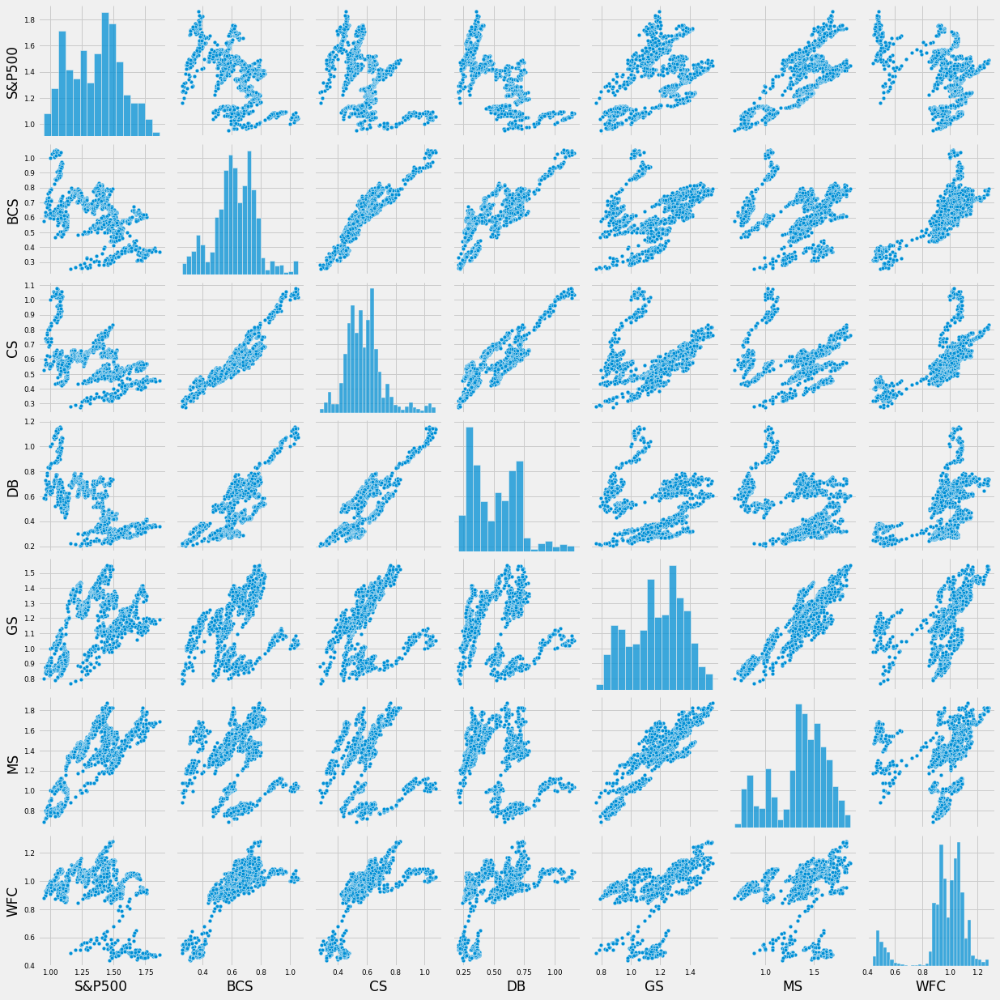

In [37]:
sns.pairplot(Finance, kind = 'scatter')
plt.ioff()

<AxesSubplot:title={'center':'Finance_Sector'}>

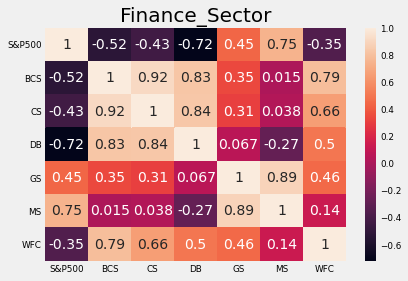

In [38]:
Finance_Corr = sns.heatmap(Finance.corr(), annot=True)
plt.title('Finance_Sector', fontsize = 20)
Finance_Corr

DB, BCS & CS have high positive correlation..
S&P & DB have high negative correlation

### Pharma_Healthcare Sector

In [39]:
#pharma & healthcare stocks

Pharma_Health=norm_data[['S&P500','BHC','JNJ','MRK','PFE','RHHBY','UNH']]

Pharma_Health.head()

,S&P500,BHC,JNJ,MRK,PFE,RHHBY,UNH
Date,,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.014315,1.015145,1.008157,1.015597,1.038945,1.003010,1.019038
2015-10-05,1.032867,0.910134,1.017066,1.037675,1.051508,1.006622,1.026070
2015-10-06,1.029161,0.924276,1.002683,1.008710,1.029837,1.009332,0.995198
2015-10-07,1.037431,0.945601,1.019427,1.032003,1.045540,0.979831,0.998456


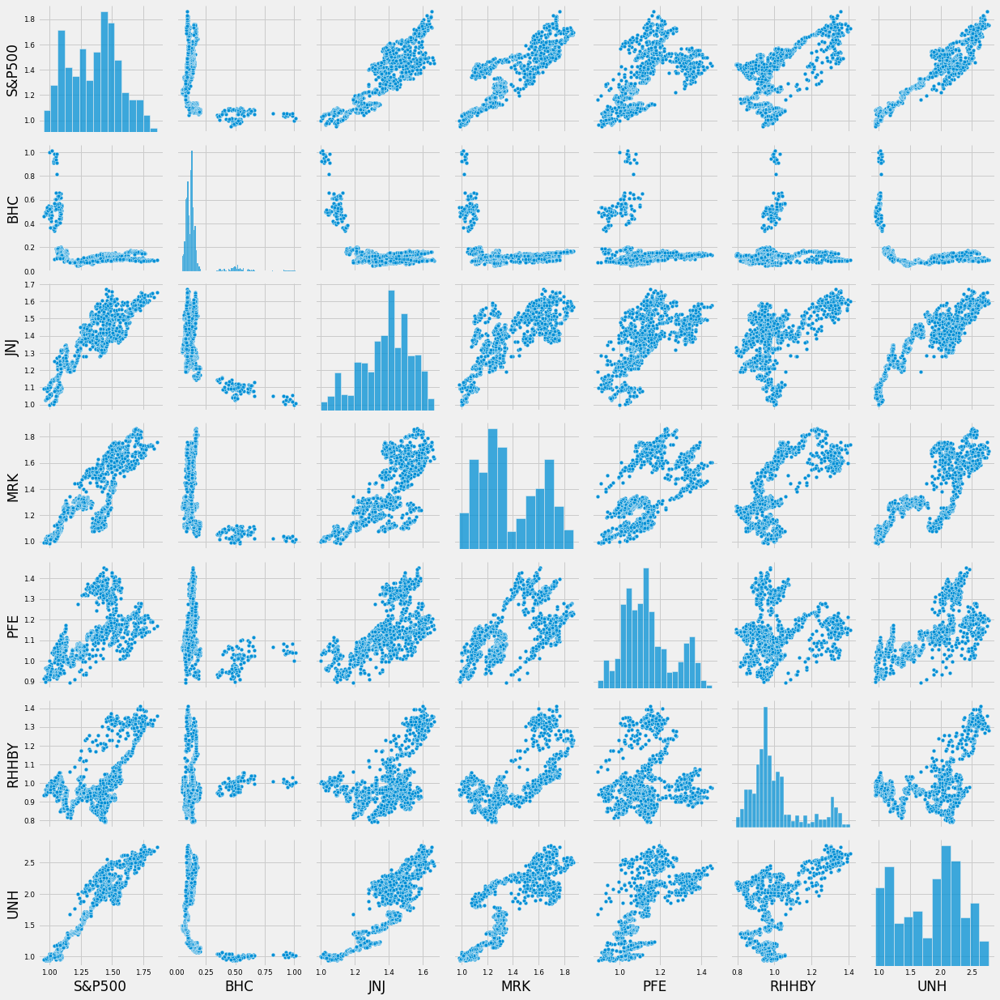

In [40]:
sns.pairplot(Pharma_Health, kind = 'scatter')
plt.ioff()

<AxesSubplot:title={'center':'Pharma_Health_Sector'}>

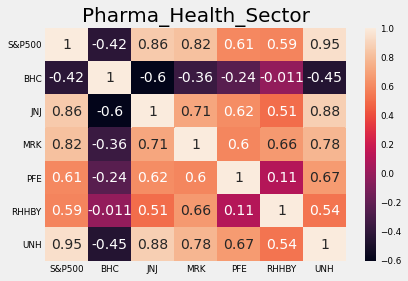

In [41]:
Pharma_Health_Corr = sns.heatmap(Pharma_Health.corr(), annot=True)
plt.title('Pharma_Health_Sector', fontsize = 20)
Pharma_Health_Corr

S&P has high positive correlation with UNH, MRK & JNJ.
BHC has high negative correlation with S&P

### Technology Sector

In [42]:
# Technology Stocks

Technology = norm_data[['S&P500','AAPL','AMZN','FB','GOOG','IBM','MSFT']]

Technology.head()

,S&P500,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.014315,1.007301,1.022699,1.012314,1.025553,1.006895,1.021520
2015-10-05,1.032867,1.010951,1.044093,1.033645,1.049371,1.037955,1.045281
2015-10-06,1.029161,1.015788,1.032186,1.020341,1.055866,1.036145,1.047971
2015-10-07,1.037431,1.010951,1.040751,1.015943,1.050827,1.045268,1.049092


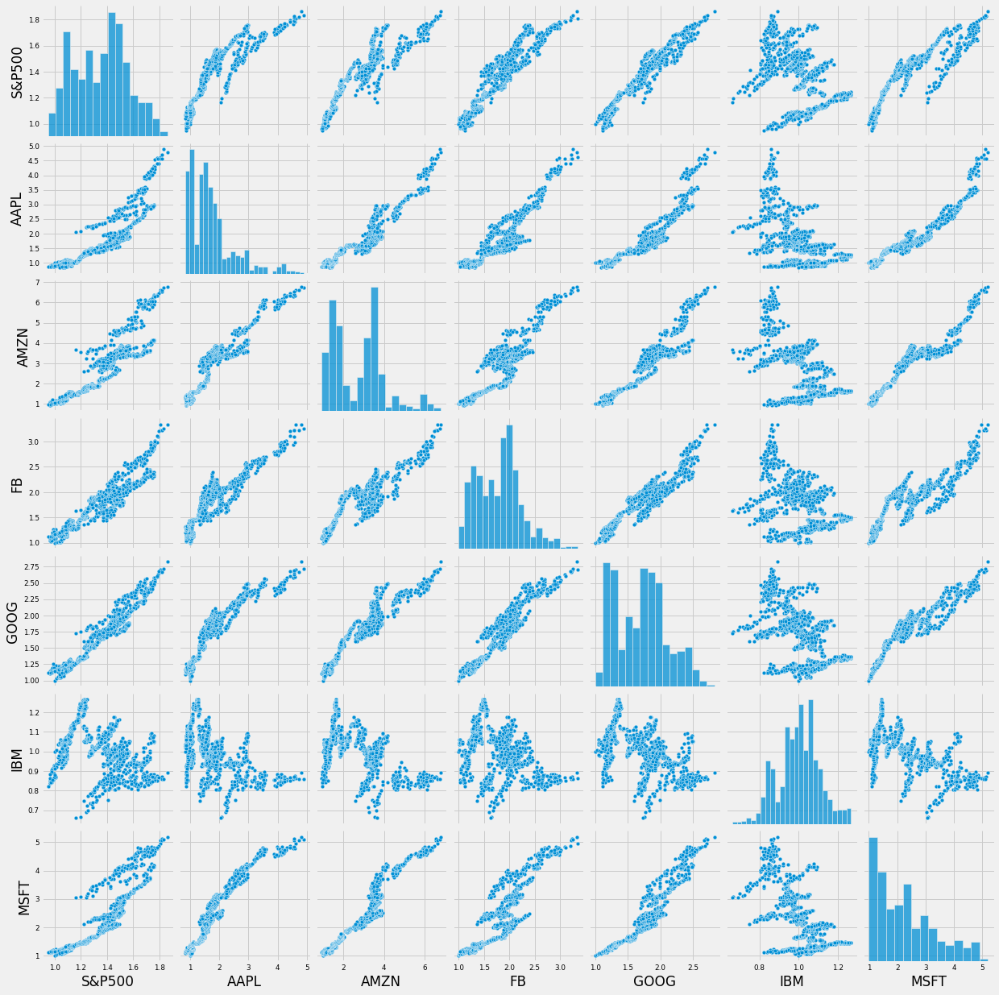

In [43]:
sns.pairplot(Technology, kind = 'scatter')
plt.ioff()

<AxesSubplot:title={'center':'Technology_Sector'}>

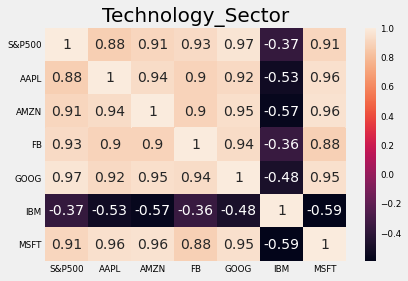

In [44]:
Technology_Corr = sns.heatmap(Technology.corr(), annot=True)
plt.title('Technology_Sector', fontsize = 20)
Technology_Corr

Leaving IBM, all other tech firms have performed better than the Index...

### Comparing all the sectors with Index(S&P500) 
##### Aviation-                    Negative correlation
##### Finance-                    Neither Negative nor Positive
##### Pharma_Health -      Positive Correlation
##### Technology-             Positive Correlation

# Metrics

### Relative Strength: This shows the performance of stock with respect to Index...

### Relative Strength = Stock value of day / Index value of the same day

In [45]:
data.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,39.200001,217.979996,80.230003,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,179.600006,93.169998,49.369999,31.840000,33.220001,116.610001,27.395000,520.719971,90.949997,611.289978,143.589996,44.610001
2015-10-02,1951.359985,38.630001,215.589996,79.260002,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,182.320007,93.930000,50.139999,33.080002,33.320000,118.830002,27.594999,532.539978,92.070000,626.909973,144.580002,45.570000
2015-10-05,1987.050049,40.189999,216.059998,80.910004,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,163.460007,94.760002,51.230000,33.480000,33.439999,119.650002,27.695000,543.679993,94.010002,641.469971,149.039993,46.630001
2015-10-06,1979.920044,38.130001,208.600006,74.529999,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,166.000000,93.419998,49.799999,32.790001,33.529999,116.050003,27.827499,537.479980,92.800003,645.440002,148.779999,46.750000
2015-10-07,1995.829956,39.310001,213.839996,75.970001,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,169.830002,94.980003,50.950001,33.290001,32.549999,116.430000,27.695000,541.940002,92.400002,642.359985,150.089996,46.799999


In [46]:
RS = data.copy()
RS.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,39.200001,217.979996,80.230003,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,179.600006,93.169998,49.369999,31.840000,33.220001,116.610001,27.395000,520.719971,90.949997,611.289978,143.589996,44.610001
2015-10-02,1951.359985,38.630001,215.589996,79.260002,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,182.320007,93.930000,50.139999,33.080002,33.320000,118.830002,27.594999,532.539978,92.070000,626.909973,144.580002,45.570000
2015-10-05,1987.050049,40.189999,216.059998,80.910004,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,163.460007,94.760002,51.230000,33.480000,33.439999,119.650002,27.695000,543.679993,94.010002,641.469971,149.039993,46.630001
2015-10-06,1979.920044,38.130001,208.600006,74.529999,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,166.000000,93.419998,49.799999,32.790001,33.529999,116.050003,27.827499,537.479980,92.800003,645.440002,148.779999,46.750000
2015-10-07,1995.829956,39.310001,213.839996,75.970001,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,169.830002,94.980003,50.950001,33.290001,32.549999,116.430000,27.695000,541.940002,92.400002,642.359985,150.089996,46.799999


In [47]:
RS.iloc[:,1:] = RS.iloc[:,1:].div(RS['S&P500'], axis=0)

In [48]:
RS.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,0.020376,0.113306,0.041703,0.023604,0.012855,0.019965,0.007802,0.012522,0.013785,0.091495,0.016374,0.026738,0.093356,0.048430,0.025662,0.016550,0.017268,0.060614,0.014240,0.270670,0.047276,0.317748,0.074638,0.023188
2015-10-02,1951.359985,0.019796,0.110482,0.040618,0.022994,0.012443,0.019668,0.007887,0.012627,0.013908,0.090711,0.016107,0.026269,0.093432,0.048136,0.025695,0.016952,0.017075,0.060896,0.014141,0.272907,0.047182,0.321268,0.074092,0.023353
2015-10-05,1987.050049,0.020226,0.108734,0.040719,0.023633,0.012833,0.019778,0.007851,0.012662,0.014192,0.090939,0.016250,0.026376,0.082263,0.047689,0.025782,0.016849,0.016829,0.060215,0.013938,0.273612,0.047311,0.322825,0.075006,0.023467
2015-10-06,1979.920044,0.019258,0.105358,0.037643,0.022774,0.012248,0.019193,0.007854,0.012819,0.014344,0.091074,0.016344,0.026279,0.083842,0.047184,0.025153,0.016561,0.016935,0.058613,0.014055,0.271465,0.046871,0.325993,0.075144,0.023612
2015-10-07,1995.829956,0.019696,0.107143,0.038064,0.023043,0.012306,0.019395,0.007881,0.012686,0.014425,0.091305,0.016499,0.026150,0.085092,0.047589,0.025528,0.016680,0.016309,0.058337,0.013876,0.271536,0.046297,0.321851,0.075202,0.023449


In [49]:
RS.to_csv('Relative_Strength.csv')
# The visualization is performed in Tableau

### Daily Returns

##### Daily returns = (Price today / Price previous day)-1  (SHould be used in %)

In [50]:
Daily_Return = data.copy()
Daily_Return.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,39.200001,217.979996,80.230003,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,179.600006,93.169998,49.369999,31.840000,33.220001,116.610001,27.395000,520.719971,90.949997,611.289978,143.589996,44.610001
2015-10-02,1951.359985,38.630001,215.589996,79.260002,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,182.320007,93.930000,50.139999,33.080002,33.320000,118.830002,27.594999,532.539978,92.070000,626.909973,144.580002,45.570000
2015-10-05,1987.050049,40.189999,216.059998,80.910004,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,163.460007,94.760002,51.230000,33.480000,33.439999,119.650002,27.695000,543.679993,94.010002,641.469971,149.039993,46.630001
2015-10-06,1979.920044,38.130001,208.600006,74.529999,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,166.000000,93.419998,49.799999,32.790001,33.529999,116.050003,27.827499,537.479980,92.800003,645.440002,148.779999,46.750000
2015-10-07,1995.829956,39.310001,213.839996,75.970001,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,169.830002,94.980003,50.950001,33.290001,32.549999,116.430000,27.695000,541.940002,92.400002,642.359985,150.089996,46.799999


In [51]:
Daily_Return = Daily_Return.pct_change()

In [52]:
Daily_Return.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.015145,0.008157,0.015597,0.038945,0.003010,0.019038,0.007301,0.022699,0.012314,0.025553,0.006895,0.021520
2015-10-05,0.018290,0.040383,0.002180,0.020818,0.046579,0.050247,0.023971,0.013645,0.021104,0.039057,0.020846,0.027362,0.022435,-0.103444,0.008836,0.021739,0.012092,0.003601,0.006901,0.003624,0.020919,0.021071,0.023225,0.030848,0.023261
2015-10-06,-0.003588,-0.051256,-0.034527,-0.078853,-0.039821,-0.049020,-0.033079,-0.003205,0.008744,0.007092,-0.002103,0.002168,-0.007251,0.015539,-0.014141,-0.027913,-0.020609,0.002691,-0.030088,0.004784,-0.011404,-0.012871,0.006189,-0.001744,0.002573
2015-10-07,0.008036,0.030947,0.025120,0.019321,0.019960,0.012783,0.018684,0.011576,-0.002364,0.013732,0.010592,0.017614,0.003075,0.023072,0.016699,0.023092,0.015249,-0.029228,0.003274,-0.004761,0.008298,-0.004310,-0.004772,0.008805,0.001069


In [53]:
Dailyreturn = Daily_Return * 100
Dailyreturn.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,1.431529,-1.454082,-1.096431,-1.209025,-1.189168,-1.819648,-0.078102,2.531646,2.283101,2.337854,0.562431,-0.222222,-0.349924,1.514477,0.815715,1.559652,3.894479,0.301020,1.903783,0.730057,2.269935,1.231449,2.555251,0.689467,2.151982
2015-10-05,1.828984,4.038307,0.218007,2.081759,4.657901,5.024707,2.397077,1.364522,2.110394,3.905682,2.084629,2.736242,2.243469,-10.344449,0.883639,2.173915,1.209184,0.360141,0.690061,0.362388,2.091865,2.107095,2.322502,3.084791,2.326094
2015-10-06,-0.358824,-5.125648,-3.452741,-7.885310,-3.982110,-4.901961,-3.307886,-0.320513,0.874400,0.709216,-0.210288,0.216785,-0.725054,1.553893,-1.414103,-2.791335,-2.060929,0.269139,-3.008775,0.478422,-1.140379,-1.287096,0.618896,-0.174446,0.257343
2015-10-07,0.803563,3.094676,2.511980,1.932111,1.996012,1.278346,1.868418,1.157556,-0.236403,1.373243,1.059222,1.761431,0.307515,2.307230,1.669883,2.309241,1.524855,-2.922756,0.327442,-0.476144,0.829802,-0.431036,-0.477196,0.880493,0.106950


In [54]:
DR = Dailyreturn.iloc[1:,:]

In [55]:
DR

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-02,1.431529,-1.454082,-1.096431,-1.209025,-1.189168,-1.819648,-0.078102,2.531646,2.283101,2.337854,0.562431,-0.222222,-0.349924,1.514477,0.815715,1.559652,3.894479,0.301020,1.903783,0.730057,2.269935,1.231449,2.555251,0.689467,2.151982
2015-10-05,1.828984,4.038307,0.218007,2.081759,4.657901,5.024707,2.397077,1.364522,2.110394,3.905682,2.084629,2.736242,2.243469,-10.344449,0.883639,2.173915,1.209184,0.360141,0.690061,0.362388,2.091865,2.107095,2.322502,3.084791,2.326094
2015-10-06,-0.358824,-5.125648,-3.452741,-7.885310,-3.982110,-4.901961,-3.307886,-0.320513,0.874400,0.709216,-0.210288,0.216785,-0.725054,1.553893,-1.414103,-2.791335,-2.060929,0.269139,-3.008775,0.478422,-1.140379,-1.287096,0.618896,-0.174446,0.257343
2015-10-07,0.803563,3.094676,2.511980,1.932111,1.996012,1.278346,1.868418,1.157556,-0.236403,1.373243,1.059222,1.761431,0.307515,2.307230,1.669883,2.309241,1.524855,-2.922756,0.327442,-0.476144,0.829802,-0.431036,-0.477196,0.880493,0.106950
2015-10-08,0.881844,1.093872,-0.551811,-0.276424,-0.065238,6.229646,0.129163,0.508582,-3.120059,-1.389378,-0.636552,0.182211,0.670630,0.789022,0.105284,0.137388,-0.600784,2.150541,-0.300608,-1.155443,-1.620111,0.075756,-0.498165,1.459127,1.388893
2015-10-09,0.072511,6.743825,2.360570,0.211188,2.719756,4.599467,3.044378,-0.632511,0.978390,3.346252,-1.038275,-0.818433,-0.761328,2.786706,0.305007,-0.137199,0.453315,-1.172929,2.748100,2.392698,1.245408,0.832699,0.696228,0.072235,-0.716544
2015-10-12,0.127548,3.347482,4.676593,2.726554,2.732474,3.078043,3.204812,0.127307,1.251514,-0.681667,0.580386,0.244493,0.076718,-1.187903,0.650094,-0.471054,-0.060171,0.426047,2.716530,-0.463792,1.924790,1.093955,0.475443,-0.820264,-0.233498
2015-10-13,-0.682542,-0.980839,-3.919077,-5.218618,-1.587629,0.568795,-0.970405,-3.623649,-1.196168,-1.235408,0.410589,-0.579262,-0.613260,-4.227786,-0.562560,-2.445273,-0.722459,0.545455,1.208061,0.170251,-0.234460,-0.148524,0.870615,-1.005693,-0.234045
2015-10-14,-0.471627,0.898408,-1.872741,-0.635824,1.801802,-1.696720,0.048996,-0.329815,0.121057,0.416953,-0.806767,-0.214658,-0.694179,6.480476,-0.963853,0.141500,0.181931,-0.482218,-1.548510,-1.413364,-0.741484,-0.053127,-0.174769,0.260660,-0.447855


In [56]:
DR.to_csv('Daily_Returns.csv')
# Visualization is performed in Tableau

In [57]:
DR.describe()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,0.051749,-0.033611,-0.004708,-0.025574,0.004181,0.003424,0.024460,-0.054837,-0.043672,-0.052886,0.030334,0.057752,-0.041431,-0.089683,0.045050,0.051124,0.020852,0.029271,0.094126,0.132215,0.161053,0.104970,0.083410,-0.000172,0.138704
std,1.208006,3.472483,2.910086,2.690691,2.647807,3.313174,2.291330,2.511873,2.284161,2.774288,1.989900,2.180951,2.034942,4.455074,1.245905,1.406695,1.382614,1.351412,1.781039,1.872922,1.896856,2.035420,1.652039,1.608610,1.753947
min,-11.984055,-25.224647,-28.329955,-23.238509,-25.992439,-26.497129,-15.109442,-21.851852,-18.259804,-17.488789,-12.705308,-15.600000,-15.867617,-51.462924,-10.037876,-8.899025,-7.734635,-8.960935,-17.276876,-12.864695,-7.922081,-18.960922,-11.100820,-12.850727,-14.739031
25%,-0.293825,-1.362281,-1.130513,-1.072065,-0.971384,-1.490796,-0.922203,-1.078669,-1.044225,-1.497620,-0.838624,-0.902312,-0.791701,-1.967809,-0.427706,-0.623984,-0.585647,-0.623653,-0.664425,-0.617850,-0.671575,-0.722265,-0.578831,-0.649782,-0.589349
50%,0.068194,-0.047980,-0.036298,0.020551,0.078274,0.034182,0.061752,0.000000,0.000000,-0.105097,0.029898,0.044479,-0.036228,-0.050130,0.049315,0.024504,0.011537,0.022948,0.080905,0.095143,0.163601,0.119318,0.097265,0.048255,0.122465
75%,0.521338,1.323266,1.163001,1.061863,0.978083,1.507790,0.998995,1.021452,1.041596,1.387203,0.970448,1.045051,0.758904,1.802160,0.592123,0.761626,0.637178,0.691940,0.816089,0.991069,1.076492,1.088035,0.878510,0.687851,0.916106
max,9.382774,41.097038,29.242785,20.307943,21.017103,24.583741,14.444134,15.104167,16.344725,14.024390,17.580307,19.770045,14.534653,33.744400,7.997719,10.408024,8.960690,13.011775,12.798934,11.980826,13.216371,15.521445,10.448543,11.301051,14.216888


### Cumulative Daily Returns

##### CDR = (Last day price / First day price) - 1

In [58]:
CDR = data.copy()

In [59]:
CDR.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,39.200001,217.979996,80.230003,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,179.600006,93.169998,49.369999,31.840000,33.220001,116.610001,27.395000,520.719971,90.949997,611.289978,143.589996,44.610001
2015-10-02,1951.359985,38.630001,215.589996,79.260002,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,182.320007,93.930000,50.139999,33.080002,33.320000,118.830002,27.594999,532.539978,92.070000,626.909973,144.580002,45.570000
2015-10-05,1987.050049,40.189999,216.059998,80.910004,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,163.460007,94.760002,51.230000,33.480000,33.439999,119.650002,27.695000,543.679993,94.010002,641.469971,149.039993,46.630001
2015-10-06,1979.920044,38.130001,208.600006,74.529999,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,166.000000,93.419998,49.799999,32.790001,33.529999,116.050003,27.827499,537.479980,92.800003,645.440002,148.779999,46.750000
2015-10-07,1995.829956,39.310001,213.839996,75.970001,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,169.830002,94.980003,50.950001,33.290001,32.549999,116.430000,27.695000,541.940002,92.400002,642.359985,150.089996,46.799999


In [60]:
#first row of the data was saved as a list called sub in the beginning
sub

[1923.819946,
 39.200001,
 217.979996,
 80.230003,
 45.41,
 24.73,
 38.41,
 15.01,
 24.09,
 26.52,
 176.020004,
 31.5,
 51.439999,
 179.600006,
 93.16999799999999,
 49.369999,
 31.84,
 33.220001,
 116.610001,
 27.395,
 520.719971,
 90.949997,
 611.289978,
 143.58999599999999,
 44.610001000000004]

In [61]:
CDR = CDR.div(sub, axis='columns')
CDR

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.014315,0.985459,0.989036,0.987910,0.988108,0.981804,0.999219,1.025316,1.022831,1.023379,1.005624,0.997778,0.996501,1.015145,1.008157,1.015597,1.038945,1.003010,1.019038,1.007301,1.022699,1.012314,1.025553,1.006895,1.021520
2015-10-05,1.032867,1.025255,0.991192,1.008476,1.034133,1.031136,1.023171,1.039307,1.044417,1.063348,1.026588,1.025079,1.018857,0.910134,1.017066,1.037675,1.051508,1.006622,1.026070,1.010951,1.044093,1.033645,1.049371,1.037955,1.045281
2015-10-06,1.029161,0.972704,0.956969,0.928954,0.992953,0.980590,0.989326,1.035976,1.053549,1.070890,1.024429,1.027302,1.011470,0.924276,1.002683,1.008710,1.029837,1.009332,0.995198,1.015788,1.032186,1.020341,1.055866,1.036145,1.047971
2015-10-07,1.037431,1.002806,0.981007,0.946903,1.012773,0.993126,1.007810,1.047968,1.051059,1.085596,1.035280,1.045397,1.014580,0.945601,1.019427,1.032003,1.045540,0.979831,0.998456,1.010951,1.040751,1.015943,1.050827,1.045268,1.049092
2015-10-08,1.046579,1.013776,0.975594,0.944285,1.012112,1.054994,1.009112,1.053298,1.018265,1.070513,1.028690,1.047302,1.021384,0.953062,1.020500,1.033421,1.039259,1.000903,0.995455,0.999270,1.023890,1.016713,1.045592,1.060520,1.063663
2015-10-09,1.047338,1.082143,0.998624,0.946279,1.039639,1.103518,1.039833,1.046636,1.028227,1.106335,1.018009,1.038730,1.013608,0.979621,1.023613,1.032003,1.043970,0.989163,1.022811,1.023179,1.036642,1.025179,1.052872,1.061286,1.056041
2015-10-12,1.048674,1.118367,1.045325,0.972080,1.068047,1.137485,1.073158,1.047968,1.041096,1.098793,1.023918,1.041270,1.014386,0.967984,1.030267,1.027142,1.043342,0.993377,1.050596,1.018434,1.056595,1.036394,1.057878,1.052580,1.053575
2015-10-13,1.041516,1.107398,1.004358,0.921351,1.051090,1.143955,1.062744,1.009993,1.028643,1.085219,1.028122,1.035238,1.008165,0.927060,1.024471,1.002026,1.035804,0.998796,1.063288,1.020168,1.054117,1.034854,1.067088,1.041995,1.051110


In [62]:
CDR = CDR -1

In [63]:
CDR

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.015145,0.008157,0.015597,0.038945,0.003010,0.019038,0.007301,0.022699,0.012314,0.025553,0.006895,0.021520
2015-10-05,0.032867,0.025255,-0.008808,0.008476,0.034133,0.031136,0.023171,0.039307,0.044417,0.063348,0.026588,0.025079,0.018857,-0.089866,0.017066,0.037675,0.051508,0.006622,0.026070,0.010951,0.044093,0.033645,0.049371,0.037955,0.045281
2015-10-06,0.029161,-0.027296,-0.043031,-0.071046,-0.007047,-0.019410,-0.010674,0.035976,0.053549,0.070890,0.024429,0.027302,0.011470,-0.075724,0.002683,0.008710,0.029837,0.009332,-0.004802,0.015788,0.032186,0.020341,0.055866,0.036145,0.047971
2015-10-07,0.037431,0.002806,-0.018993,-0.053097,0.012773,-0.006874,0.007810,0.047968,0.051059,0.085596,0.035280,0.045397,0.014580,-0.054399,0.019427,0.032003,0.045540,-0.020169,-0.001544,0.010951,0.040751,0.015943,0.050827,0.045268,0.049092
2015-10-08,0.046579,0.013776,-0.024406,-0.055715,0.012112,0.054994,0.009112,0.053298,0.018265,0.070513,0.028690,0.047302,0.021384,-0.046938,0.020500,0.033421,0.039259,0.000903,-0.004545,-0.000730,0.023890,0.016713,0.045592,0.060520,0.063663
2015-10-09,0.047338,0.082143,-0.001376,-0.053721,0.039639,0.103518,0.039833,0.046636,0.028227,0.106335,0.018009,0.038730,0.013608,-0.020379,0.023613,0.032003,0.043970,-0.010837,0.022811,0.023179,0.036642,0.025179,0.052872,0.061286,0.056041
2015-10-12,0.048674,0.118367,0.045325,-0.027920,0.068047,0.137485,0.073158,0.047968,0.041096,0.098793,0.023918,0.041270,0.014386,-0.032016,0.030267,0.027142,0.043342,-0.006623,0.050596,0.018434,0.056595,0.036394,0.057878,0.052580,0.053575
2015-10-13,0.041516,0.107398,0.004358,-0.078649,0.051090,0.143955,0.062744,0.009993,0.028643,0.085219,0.028122,0.035238,0.008165,-0.072940,0.024471,0.002026,0.035804,-0.001204,0.063288,0.020168,0.054117,0.034854,0.067088,0.041995,0.051110


In [64]:
CDR = CDR * 100

In [65]:
# CDR in percentage is the final CDR...
CDR

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2015-10-02,1.431529,-1.454082,-1.096431,-1.209025,-1.189168,-1.819648,-0.078102,2.531646,2.283101,2.337854,0.562431,-0.222222,-0.349924,1.514477,0.815715,1.559652,3.894479,0.301020,1.903783,0.730057,2.269935,1.231449,2.555251,0.689467,2.151982
2015-10-05,3.286695,2.525505,-0.880814,0.847564,3.413343,3.113627,2.317102,3.930713,4.441677,6.334845,2.658785,2.507940,1.885694,-8.986636,1.706562,3.767472,5.150754,0.662246,2.606981,1.095090,4.409284,3.364492,4.937099,3.795527,4.528133
2015-10-06,2.916078,-2.729592,-4.303143,-7.104579,-0.704691,-1.940962,-1.067430,3.597602,5.354915,7.088989,2.442906,2.730162,1.146967,-7.572386,0.268327,0.870974,2.983671,0.933167,-0.480232,1.578752,3.218622,2.034091,5.586551,3.614460,4.797128
2015-10-07,3.743074,0.280612,-1.899257,-5.309737,1.277256,-0.687428,0.781044,4.796802,5.105853,8.559581,3.528004,4.539683,1.458009,-5.439868,1.942691,3.200328,4.554023,-2.016863,-0.154362,1.095090,4.075133,1.594288,5.082695,4.526778,4.909209
2015-10-08,4.657926,1.377554,-2.440587,-5.571483,1.211185,5.499393,0.911216,5.329780,1.826488,7.051278,2.868994,4.730165,2.138418,-4.693768,2.050020,3.342113,3.925879,0.090304,-0.454506,-0.073006,2.389000,1.671252,4.559210,6.051956,6.366285
2015-10-09,4.733815,8.214278,-0.137629,-5.372061,3.963882,10.351803,3.983335,4.663558,2.822748,10.633484,1.800931,3.873019,1.360809,-2.037864,2.361281,3.200328,4.396991,-1.083684,2.281105,2.317945,3.664161,2.517868,5.287181,6.128563,5.604125
2015-10-12,4.867400,11.836732,4.532528,-2.791979,6.804669,13.748480,7.315806,4.796802,4.109589,9.879333,2.391769,4.126981,1.438571,-3.201559,3.026725,2.714199,4.334174,-0.662255,5.059601,1.843402,5.659478,3.639368,5.787761,5.258029,5.357541
2015-10-13,4.151636,10.739793,0.435818,-7.864894,5.109007,14.395475,6.274408,0.999334,2.864263,8.521874,2.812179,3.523813,0.816489,-7.293990,2.447139,0.202556,3.580402,-0.120412,6.328786,2.016791,5.411748,3.485438,6.708765,4.199456,5.110957


### Last row of CDR is the Correct and to be used values of CDR in our analysis...

In [66]:
Cumulative_Daily_returns = CDR.tail(1)
Cumulative_Daily_returns

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-30,74.808459,-68.64796,-45.040827,-54.343762,-32.658005,-47.877072,-2.369175,-66.622252,-58.613533,-68.325792,14.174524,53.492057,-54.296267,-91.347439,59.793934,68.017012,15.263822,28.868151,167.361278,322.741369,504.68777,187.960421,140.40963,-15.265686,371.486208


In [68]:
Cum_daily_returns = Cumulative_Daily_returns.reset_index()
Cum_daily_returns

,Date,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
0,2020-09-30,74.808459,-68.64796,-45.040827,-54.343762,-32.658005,-47.877072,-2.369175,-66.622252,-58.613533,-68.325792,14.174524,53.492057,-54.296267,-91.347439,59.793934,68.017012,15.263822,28.868151,167.361278,322.741369,504.68777,187.960421,140.40963,-15.265686,371.486208


In [69]:
Cum_daily_returns = Cum_daily_returns.transpose()
Cum_daily_returns

,0
Date,2020-09-30 00:00:00
S&P500,74.8085
AAL,-68.648
ALGT,-45.0408
ALk,-54.3438
DAL,-32.658
HA,-47.8771
LUV,-2.36917
BCS,-66.6223
CS,-58.6135


In [70]:
Cum_daily_returns = Cum_daily_returns[1:]

In [71]:
Cum_daily_returns

,0
S&P500,74.8085
AAL,-68.648
ALGT,-45.0408
ALk,-54.3438
DAL,-32.658
HA,-47.8771
LUV,-2.36917
BCS,-66.6223
CS,-58.6135
DB,-68.3258


In [72]:
Cum_daily_returns = Cum_daily_returns.rename(columns = {0: 'Cumulative Returns'}, inplace = False)

In [73]:
Cum_daily_returns

,Cumulative Returns
S&P500,74.8085
AAL,-68.648
ALGT,-45.0408
ALk,-54.3438
DAL,-32.658
HA,-47.8771
LUV,-2.36917
BCS,-66.6223
CS,-58.6135
DB,-68.3258


In [74]:
Cum_daily_returns = Cum_daily_returns.sort_values('Cumulative Returns', ascending = False)
Cum_daily_returns

,Cumulative Returns
AMZN,504.688
MSFT,371.486
AAPL,322.741
FB,187.96
UNH,167.361
GOOG,140.41
S&P500,74.8085
MRK,68.017
JNJ,59.7939
MS,53.4921


In [75]:
# we have to change the datatype to float from object
Cum_daily_returns['Cumulative Returns'] = Cum_daily_returns['Cumulative Returns'].astype(float, errors = 'raise')

# let's round of the values to 2 decimals only...
Cum_daily_returns = round(Cum_daily_returns['Cumulative Returns'], 2)

# lets check the dataframe
Cum_daily_returns

AMZN      504.69
MSFT      371.49
AAPL      322.74
FB        187.96
UNH       167.36
GOOG      140.41
S&P500     74.81
MRK        68.02
JNJ        59.79
MS         53.49
RHHBY      28.87
PFE        15.26
GS         14.17
LUV        -2.37
IBM       -15.27
DAL       -32.66
ALGT      -45.04
HA        -47.88
WFC       -54.30
ALk       -54.34
CS        -58.61
BCS       -66.62
DB        -68.33
AAL       -68.65
BHC       -91.35
Name: Cumulative Returns, dtype: float64

### Further Metrics required

In [76]:
DR.describe()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,0.051749,-0.033611,-0.004708,-0.025574,0.004181,0.003424,0.024460,-0.054837,-0.043672,-0.052886,0.030334,0.057752,-0.041431,-0.089683,0.045050,0.051124,0.020852,0.029271,0.094126,0.132215,0.161053,0.104970,0.083410,-0.000172,0.138704
std,1.208006,3.472483,2.910086,2.690691,2.647807,3.313174,2.291330,2.511873,2.284161,2.774288,1.989900,2.180951,2.034942,4.455074,1.245905,1.406695,1.382614,1.351412,1.781039,1.872922,1.896856,2.035420,1.652039,1.608610,1.753947
min,-11.984055,-25.224647,-28.329955,-23.238509,-25.992439,-26.497129,-15.109442,-21.851852,-18.259804,-17.488789,-12.705308,-15.600000,-15.867617,-51.462924,-10.037876,-8.899025,-7.734635,-8.960935,-17.276876,-12.864695,-7.922081,-18.960922,-11.100820,-12.850727,-14.739031
25%,-0.293825,-1.362281,-1.130513,-1.072065,-0.971384,-1.490796,-0.922203,-1.078669,-1.044225,-1.497620,-0.838624,-0.902312,-0.791701,-1.967809,-0.427706,-0.623984,-0.585647,-0.623653,-0.664425,-0.617850,-0.671575,-0.722265,-0.578831,-0.649782,-0.589349
50%,0.068194,-0.047980,-0.036298,0.020551,0.078274,0.034182,0.061752,0.000000,0.000000,-0.105097,0.029898,0.044479,-0.036228,-0.050130,0.049315,0.024504,0.011537,0.022948,0.080905,0.095143,0.163601,0.119318,0.097265,0.048255,0.122465
75%,0.521338,1.323266,1.163001,1.061863,0.978083,1.507790,0.998995,1.021452,1.041596,1.387203,0.970448,1.045051,0.758904,1.802160,0.592123,0.761626,0.637178,0.691940,0.816089,0.991069,1.076492,1.088035,0.878510,0.687851,0.916106
max,9.382774,41.097038,29.242785,20.307943,21.017103,24.583741,14.444134,15.104167,16.344725,14.024390,17.580307,19.770045,14.534653,33.744400,7.997719,10.408024,8.960690,13.011775,12.798934,11.980826,13.216371,15.521445,10.448543,11.301051,14.216888


In [77]:
# here we need mean and standard deviation of all the stocks. We also need min max values as we are asked to plot them.... 
df = DR.describe()[1:8].T.sort_values('mean', ascending = False) # sorting the values by mean
df

,mean,std,min,25%,50%,75%,max
AMZN,0.161053,1.896856,-7.922081,-0.671575,0.163601,1.076492,13.216371
MSFT,0.138704,1.753947,-14.739031,-0.589349,0.122465,0.916106,14.216888
AAPL,0.132215,1.872922,-12.864695,-0.617850,0.095143,0.991069,11.980826
FB,0.104970,2.035420,-18.960922,-0.722265,0.119318,1.088035,15.521445
UNH,0.094126,1.781039,-17.276876,-0.664425,0.080905,0.816089,12.798934
GOOG,0.083410,1.652039,-11.100820,-0.578831,0.097265,0.878510,10.448543
MS,0.057752,2.180951,-15.600000,-0.902312,0.044479,1.045051,19.770045
S&P500,0.051749,1.208006,-11.984055,-0.293825,0.068194,0.521338,9.382774
MRK,0.051124,1.406695,-8.899025,-0.623984,0.024504,0.761626,10.408024
JNJ,0.045050,1.245905,-10.037876,-0.427706,0.049315,0.592123,7.997719


In [78]:
# dropping the unnecessary columns
df_1 = df.drop(['25%', '50%', '75%'], axis = 1)

In [79]:
df_1

,mean,std,min,max
AMZN,0.161053,1.896856,-7.922081,13.216371
MSFT,0.138704,1.753947,-14.739031,14.216888
AAPL,0.132215,1.872922,-12.864695,11.980826
FB,0.104970,2.035420,-18.960922,15.521445
UNH,0.094126,1.781039,-17.276876,12.798934
GOOG,0.083410,1.652039,-11.100820,10.448543
MS,0.057752,2.180951,-15.600000,19.770045
S&P500,0.051749,1.208006,-11.984055,9.382774
MRK,0.051124,1.406695,-8.899025,10.408024
JNJ,0.045050,1.245905,-10.037876,7.997719


In [80]:
# Renaming the columns names 
Metrics = df_1.rename(columns = {'mean': 'Avg Daily Returns', 'std':'Risk/Volatilty', "min": "Minimum", "max" : "Maximum" }, inplace = False)

# lets check the dataframe
Metrics

,Avg Daily Returns,Risk/Volatilty,Minimum,Maximum
AMZN,0.161053,1.896856,-7.922081,13.216371
MSFT,0.138704,1.753947,-14.739031,14.216888
AAPL,0.132215,1.872922,-12.864695,11.980826
FB,0.104970,2.035420,-18.960922,15.521445
UNH,0.094126,1.781039,-17.276876,12.798934
GOOG,0.083410,1.652039,-11.100820,10.448543
MS,0.057752,2.180951,-15.600000,19.770045
S&P500,0.051749,1.208006,-11.984055,9.382774
MRK,0.051124,1.406695,-8.899025,10.408024
JNJ,0.045050,1.245905,-10.037876,7.997719


In [81]:
# Lets calculate Annualized Returns

# As we have 252 days in a year to trade.. we need to multiply this value to daily returns to get annualized returns 
Metrics["Annualized_Returns"] =Metrics["Avg Daily Returns"]*252

#Annualized risk formula is...

Metrics["Annualized_Risk"] = np.sqrt(252) * Metrics["Risk/Volatilty"]

# Sharpe Ratio is our next step

# risk free rate = 0.75%
Metrics["Sharpe_Ratio"] = ((Metrics["Annualized_Returns"] - 0.0075) / Metrics["Annualized_Risk"]) / 100 #we have divided by 100 to cancel the roundoff 

# lets see the dataframe
Metrics

,Avg Daily Returns,Risk/Volatilty,Minimum,Maximum,Annualized_Returns,Annualized_Risk,Sharpe_Ratio
AMZN,0.161053,1.896856,-7.922081,13.216371,40.585455,30.111660,0.013476
MSFT,0.138704,1.753947,-14.739031,14.216888,34.953498,27.843048,0.012551
AAPL,0.132215,1.872922,-12.864695,11.980826,33.318190,29.731721,0.011204
FB,0.104970,2.035420,-18.960922,15.521445,26.452355,32.311293,0.008184
UNH,0.094126,1.781039,-17.276876,12.798934,23.719727,28.273114,0.008387
GOOG,0.083410,1.652039,-11.100820,10.448543,21.019428,26.225301,0.008012
MS,0.057752,2.180951,-15.600000,19.770045,14.553615,34.621529,0.004201
S&P500,0.051749,1.208006,-11.984055,9.382774,13.040656,19.176501,0.006796
MRK,0.051124,1.406695,-8.899025,10.408024,12.883185,22.330584,0.005766
JNJ,0.045050,1.245905,-10.037876,7.997719,11.352656,19.778133,0.005736


In [82]:
Metrics['Sharpe_Ratio'] = Metrics['Sharpe_Ratio'] * 100
# round off the values by 2 decimal points for easy refernce
Metrics = round(Metrics, 2)

# lets check the dataframe
Metrics

,Avg Daily Returns,Risk/Volatilty,Minimum,Maximum,Annualized_Returns,Annualized_Risk,Sharpe_Ratio
AMZN,0.16,1.90,-7.92,13.22,40.59,30.11,1.35
MSFT,0.14,1.75,-14.74,14.22,34.95,27.84,1.26
AAPL,0.13,1.87,-12.86,11.98,33.32,29.73,1.12
FB,0.10,2.04,-18.96,15.52,26.45,32.31,0.82
UNH,0.09,1.78,-17.28,12.80,23.72,28.27,0.84
GOOG,0.08,1.65,-11.10,10.45,21.02,26.23,0.80
MS,0.06,2.18,-15.60,19.77,14.55,34.62,0.42
S&P500,0.05,1.21,-11.98,9.38,13.04,19.18,0.68
MRK,0.05,1.41,-8.90,10.41,12.88,22.33,0.58
JNJ,0.05,1.25,-10.04,8.00,11.35,19.78,0.57


In [83]:
# Let's concatenate the cumulative daily returns to the metrics here....
Complete_Metrics = pd.concat([Metrics, Cum_daily_returns], axis=1)

Complete_Metrics

,Avg Daily Returns,Risk/Volatilty,Minimum,Maximum,Annualized_Returns,Annualized_Risk,Sharpe_Ratio,Cumulative Returns
AMZN,0.16,1.90,-7.92,13.22,40.59,30.11,1.35,504.69
MSFT,0.14,1.75,-14.74,14.22,34.95,27.84,1.26,371.49
AAPL,0.13,1.87,-12.86,11.98,33.32,29.73,1.12,322.74
FB,0.10,2.04,-18.96,15.52,26.45,32.31,0.82,187.96
UNH,0.09,1.78,-17.28,12.80,23.72,28.27,0.84,167.36
GOOG,0.08,1.65,-11.10,10.45,21.02,26.23,0.80,140.41
MS,0.06,2.18,-15.60,19.77,14.55,34.62,0.42,53.49
S&P500,0.05,1.21,-11.98,9.38,13.04,19.18,0.68,74.81
MRK,0.05,1.41,-8.90,10.41,12.88,22.33,0.58,68.02
JNJ,0.05,1.25,-10.04,8.00,11.35,19.78,0.57,59.79


In [84]:
Complete_Metrics.to_csv('Metrics.csv')

In [85]:
#Lets chek correlation for Daily returns
correlated_data = DR.corr(method='pearson')
correlated_data

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
S&P500,1.000000,0.479246,0.544487,0.580490,0.568780,0.455658,0.557937,0.611233,0.693428,0.566802,0.788246,0.809651,0.734272,0.375681,0.646677,0.615109,0.624083,0.565034,0.696777,0.751493,0.594796,0.630787,0.762991,0.739867,0.827098
AAL,0.479246,1.000000,0.579706,0.733505,0.829850,0.678649,0.706998,0.475157,0.445815,0.437318,0.520578,0.526472,0.522187,0.235241,0.213944,0.218528,0.236146,0.157943,0.305984,0.299843,0.193300,0.211733,0.301783,0.413348,0.290612
ALGT,0.544487,0.579706,1.000000,0.657804,0.637248,0.566572,0.601910,0.446488,0.470638,0.392557,0.517691,0.522369,0.533780,0.229450,0.278058,0.291378,0.291210,0.222179,0.407920,0.328264,0.195060,0.324648,0.330087,0.422621,0.368355
ALk,0.580490,0.733505,0.657804,1.000000,0.795413,0.697316,0.741441,0.521933,0.508968,0.446771,0.549087,0.551062,0.581607,0.262695,0.281051,0.299998,0.326724,0.208754,0.408209,0.349964,0.232784,0.271539,0.371574,0.485288,0.368212
DAL,0.568780,0.829850,0.637248,0.795413,1.000000,0.715977,0.778353,0.551492,0.504912,0.468867,0.569677,0.582898,0.560966,0.278787,0.269399,0.287717,0.316215,0.217992,0.390862,0.360811,0.211382,0.269099,0.365885,0.464564,0.356571
HA,0.455658,0.678649,0.566572,0.697316,0.715977,1.000000,0.613110,0.439707,0.423485,0.393979,0.481643,0.473472,0.472660,0.194587,0.220140,0.203628,0.246123,0.183231,0.315179,0.246556,0.173405,0.214358,0.270801,0.372019,0.274123
LUV,0.557937,0.706998,0.601910,0.741441,0.778353,0.613110,1.000000,0.498632,0.463242,0.456853,0.536294,0.549303,0.547597,0.244176,0.293008,0.313664,0.327600,0.213433,0.354692,0.358673,0.234028,0.260485,0.362813,0.489357,0.377887
BCS,0.611233,0.475157,0.446488,0.521933,0.551492,0.439707,0.498632,1.000000,0.747431,0.714576,0.657455,0.675033,0.629474,0.292941,0.257389,0.308732,0.313739,0.274826,0.404124,0.370249,0.246299,0.311863,0.390867,0.485761,0.414032
CS,0.693428,0.445815,0.470638,0.508968,0.504912,0.423485,0.463242,0.747431,1.000000,0.770756,0.714506,0.745441,0.683834,0.331888,0.342612,0.394230,0.397479,0.377242,0.459504,0.447098,0.302168,0.379142,0.461967,0.535062,0.477578
DB,0.566802,0.437318,0.392557,0.446771,0.468867,0.393979,0.456853,0.714576,0.770756,1.000000,0.651899,0.666377,0.591374,0.257165,0.247296,0.292680,0.308370,0.260341,0.337198,0.362987,0.277701,0.294152,0.401694,0.458790,0.392557


<AxesSubplot:>

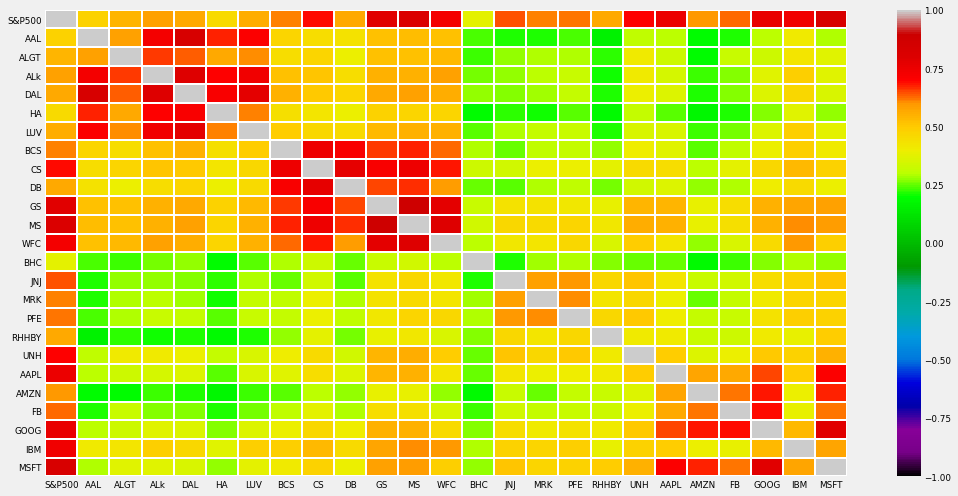

In [86]:
plt.figure(figsize=(16,8))
sns.heatmap(correlated_data, cmap='nipy_spectral', vmax=1.0, vmin=-1.0 , linewidths=1.0)

### MSFT has good correlation with AAPL, AMZN and GOOG

### GOOG has good correlation with AAPL, AMZN and FB

### WFC has good correlation with CS, GS and MS

### MS has good correlation with BCS, CS, DB and GS

In [87]:
Complete_Metrics

,Avg Daily Returns,Risk/Volatilty,Minimum,Maximum,Annualized_Returns,Annualized_Risk,Sharpe_Ratio,Cumulative Returns
AMZN,0.16,1.90,-7.92,13.22,40.59,30.11,1.35,504.69
MSFT,0.14,1.75,-14.74,14.22,34.95,27.84,1.26,371.49
AAPL,0.13,1.87,-12.86,11.98,33.32,29.73,1.12,322.74
FB,0.10,2.04,-18.96,15.52,26.45,32.31,0.82,187.96
UNH,0.09,1.78,-17.28,12.80,23.72,28.27,0.84,167.36
GOOG,0.08,1.65,-11.10,10.45,21.02,26.23,0.80,140.41
MS,0.06,2.18,-15.60,19.77,14.55,34.62,0.42,53.49
S&P500,0.05,1.21,-11.98,9.38,13.04,19.18,0.68,74.81
MRK,0.05,1.41,-8.90,10.41,12.88,22.33,0.58,68.02
JNJ,0.05,1.25,-10.04,8.00,11.35,19.78,0.57,59.79


In [88]:
#Positive_returns = Complete_Metrics[Cumulative Returns>0]
#Positive_returns

In [89]:
Positive_returns = Complete_Metrics.sort_values('Cumulative Returns', ascending = False)
Positive_returns

,Avg Daily Returns,Risk/Volatilty,Minimum,Maximum,Annualized_Returns,Annualized_Risk,Sharpe_Ratio,Cumulative Returns
AMZN,0.16,1.90,-7.92,13.22,40.59,30.11,1.35,504.69
MSFT,0.14,1.75,-14.74,14.22,34.95,27.84,1.26,371.49
AAPL,0.13,1.87,-12.86,11.98,33.32,29.73,1.12,322.74
FB,0.10,2.04,-18.96,15.52,26.45,32.31,0.82,187.96
UNH,0.09,1.78,-17.28,12.80,23.72,28.27,0.84,167.36
GOOG,0.08,1.65,-11.10,10.45,21.02,26.23,0.80,140.41
S&P500,0.05,1.21,-11.98,9.38,13.04,19.18,0.68,74.81
MRK,0.05,1.41,-8.90,10.41,12.88,22.33,0.58,68.02
JNJ,0.05,1.25,-10.04,8.00,11.35,19.78,0.57,59.79
MS,0.06,2.18,-15.60,19.77,14.55,34.62,0.42,53.49


In [90]:
### We can remove all the stocks with negative cumulative returns as they are of no use...

In [91]:
Positive_returns = Positive_returns[Positive_returns['Cumulative Returns'] >= 0]
Positive_returns

,Avg Daily Returns,Risk/Volatilty,Minimum,Maximum,Annualized_Returns,Annualized_Risk,Sharpe_Ratio,Cumulative Returns
AMZN,0.16,1.90,-7.92,13.22,40.59,30.11,1.35,504.69
MSFT,0.14,1.75,-14.74,14.22,34.95,27.84,1.26,371.49
AAPL,0.13,1.87,-12.86,11.98,33.32,29.73,1.12,322.74
FB,0.10,2.04,-18.96,15.52,26.45,32.31,0.82,187.96
UNH,0.09,1.78,-17.28,12.80,23.72,28.27,0.84,167.36
GOOG,0.08,1.65,-11.10,10.45,21.02,26.23,0.80,140.41
S&P500,0.05,1.21,-11.98,9.38,13.04,19.18,0.68,74.81
MRK,0.05,1.41,-8.90,10.41,12.88,22.33,0.58,68.02
JNJ,0.05,1.25,-10.04,8.00,11.35,19.78,0.57,59.79
MS,0.06,2.18,-15.60,19.77,14.55,34.62,0.42,53.49


# Mr. Patrick Portfolio

### Among all the stocks, S&P500 has a Annualized_risk of  19.18. Mr. Patrick wanted low risk and double the amount of investment as return. So, the stocks with low Annualized_Risk as index are JNJ, RHBY, PFE and MRK. But as the Return is very low for PFE it can be removed and instead a portion can be invested in AMZN, GOOG or MSFT. But as the risk of MSFT is low we can select that for first set of combination.
### So our first combination Stocks for Mr. Patrick are JNJ, RHBY, MRK and MSFT

# First Combination

In [115]:
Patrick_Portfolio = ['JNJ' , 'RHHBY' , 'MRK' , 'MSFT']
Patrick_Weights = np.array([0.25 , 0.25 , 0.25 , 0.25])


In [116]:
DR.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-02,1.431529,-1.454082,-1.096431,-1.209025,-1.189168,-1.819648,-0.078102,2.531646,2.283101,2.337854,0.562431,-0.222222,-0.349924,1.514477,0.815715,1.559652,3.894479,0.301020,1.903783,0.730057,2.269935,1.231449,2.555251,0.689467,2.151982
2015-10-05,1.828984,4.038307,0.218007,2.081759,4.657901,5.024707,2.397077,1.364522,2.110394,3.905682,2.084629,2.736242,2.243469,-10.344449,0.883639,2.173915,1.209184,0.360141,0.690061,0.362388,2.091865,2.107095,2.322502,3.084791,2.326094
2015-10-06,-0.358824,-5.125648,-3.452741,-7.885310,-3.982110,-4.901961,-3.307886,-0.320513,0.874400,0.709216,-0.210288,0.216785,-0.725054,1.553893,-1.414103,-2.791335,-2.060929,0.269139,-3.008775,0.478422,-1.140379,-1.287096,0.618896,-0.174446,0.257343
2015-10-07,0.803563,3.094676,2.511980,1.932111,1.996012,1.278346,1.868418,1.157556,-0.236403,1.373243,1.059222,1.761431,0.307515,2.307230,1.669883,2.309241,1.524855,-2.922756,0.327442,-0.476144,0.829802,-0.431036,-0.477196,0.880493,0.106950
2015-10-08,0.881844,1.093872,-0.551811,-0.276424,-0.065238,6.229646,0.129163,0.508582,-3.120059,-1.389378,-0.636552,0.182211,0.670630,0.789022,0.105284,0.137388,-0.600784,2.150541,-0.300608,-1.155443,-1.620111,0.075756,-0.498165,1.459127,1.388893


In [117]:
Return_Stocks=DR[Patrick_Portfolio]
Return_Stocks

,JNJ,RHHBY,MRK,MSFT
Date,,,,
2015-10-02,0.815715,0.301020,1.559652,2.151982
2015-10-05,0.883639,0.360141,2.173915,2.326094
2015-10-06,-1.414103,0.269139,-2.791335,0.257343
2015-10-07,1.669883,-2.922756,2.309241,0.106950
2015-10-08,0.105284,2.150541,0.137388,1.388893
2015-10-09,0.305007,-1.172929,-0.137199,-0.716544
2015-10-12,0.650094,0.426047,-0.471054,-0.233498
2015-10-13,-0.562560,0.545455,-2.445273,-0.234045
2015-10-14,-0.963853,-0.482218,0.141500,-0.447855


In [118]:
Return_Stocks = Return_Stocks/100
Return_Stocks

,JNJ,RHHBY,MRK,MSFT
Date,,,,
2015-10-02,0.008157,0.003010,0.015597,0.021520
2015-10-05,0.008836,0.003601,0.021739,0.023261
2015-10-06,-0.014141,0.002691,-0.027913,0.002573
2015-10-07,0.016699,-0.029228,0.023092,0.001069
2015-10-08,0.001053,0.021505,0.001374,0.013889
2015-10-09,0.003050,-0.011729,-0.001372,-0.007165
2015-10-12,0.006501,0.004260,-0.004711,-0.002335
2015-10-13,-0.005626,0.005455,-0.024453,-0.002340
2015-10-14,-0.009639,-0.004822,0.001415,-0.004479


### Risk of stocks

In [119]:
stock_risk = Return_Stocks.std()
print(stock_risk)

JNJ      0.012459
RHHBY    0.013514
MRK      0.014067
MSFT     0.017539
dtype: float64


### Microsoft has higher risk in this portfolio

In [120]:
# Average daily return from each stock
daily_returns_mean = Return_Stocks.mean()
print(daily_returns_mean)

JNJ      0.000451
RHHBY    0.000293
MRK      0.000511
MSFT     0.001387
dtype: float64


### Microsoft has performed good

In [121]:
# Total Portfolio Return - Store the reults in "portfolio_return"
allocated_daily_returns = (Patrick_Weights * daily_returns_mean)
portfolio_return = np.sum(allocated_daily_returns)
print(portfolio_return)

0.0006603738600705661


In [122]:
# Portfolio daily returns
Return_Stocks['Portfolio_Daily_Return'] = Return_Stocks.dot(Patrick_Weights)
Return_Stocks.tail(5)

,JNJ,RHHBY,MRK,MSFT,Portfolio_Daily_Return
Date,,,,,
2020-09-24,0.001592,-0.003567,0.006293,0.012962,0.004320
2020-09-25,0.006843,0.002685,-0.002646,0.022787,0.007417
2020-09-28,0.009955,-0.015841,-0.002050,0.007795,-0.000035
2020-09-29,-0.000340,-0.016776,-0.010391,-0.010409,-0.009479
2020-09-30,0.012376,-0.012912,0.012820,0.014812,0.006774


<AxesSubplot:xlabel='Date'>

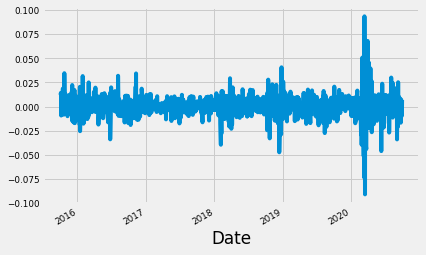

In [123]:
# Plot
Return_Stocks['Portfolio_Daily_Return'].plot()

### Major fluctuation has happened in the year 2020

### Cumulative return
Cumulative return of an investment is the cumulative gain or loss from an investment over the given period of time.

In [124]:
# Cumulative return from the portfolio
Cumulative_returns_daily = (1+Return_Stocks).cumprod()
Cumulative_returns_daily.tail(5)

,JNJ,RHHBY,MRK,MSFT,Portfolio_Daily_Return
Date,,,,,
2020-09-24,1.552753,1.345575,1.684221,4.554808,2.106791
2020-09-25,1.563379,1.349187,1.679765,4.658597,2.122417
2020-09-28,1.578942,1.327815,1.676322,4.694911,2.122342
2020-09-29,1.578405,1.305539,1.658902,4.646043,2.102224
2020-09-30,1.597939,1.288682,1.680170,4.714862,2.116465


<AxesSubplot:xlabel='Date'>

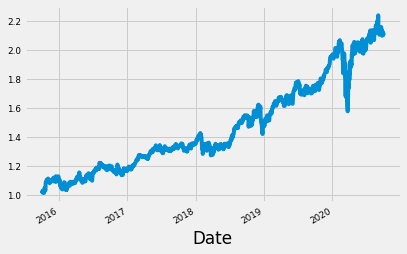

In [125]:
Cumulative_returns_daily['Portfolio_Daily_Return'].plot()

### Portfolio_Risk

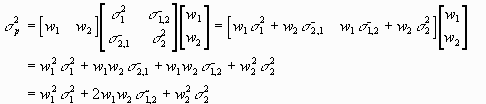

By looking into the portfolio standard deviation formula, we need three elements:
- Portfolio weight array
- Portfolio covariance matrix
- Transpose of portfolio weight array

The weight for each stock in the portfolio is already abailable. We need to calculate the daily covariance. Remember, the covariance must be annualised by **multiplying with 252 (the trading days in a year)**.

In [126]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.
covariance_portfolio = Return_Stocks.iloc[:,:-1]
covariance_portfolio = (covariance_portfolio.cov())*252

covariance_portfolio

,JNJ,RHHBY,MRK,MSFT
JNJ,0.039117,0.019560,0.025844,0.028277
RHHBY,0.019560,0.046023,0.020306,0.029796
MRK,0.025844,0.020306,0.049865,0.029374
MSFT,0.028277,0.029796,0.029374,0.077524


In [127]:
# Applying the matrix operations mentioned in the image above
portfolio_variance = np.dot(Patrick_Weights.T,np.dot(covariance_portfolio, Patrick_Weights))
portfolio_variance

0.03242785337860733

In [128]:
# Standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk

0.18007735387495935

### Portfolio_Sharpe_Ratio

In [129]:
# Assuming that the risk free rate is zero
Sharpe_Ratio_Portfolio = Return_Stocks['Portfolio_Daily_Return'].mean() / Return_Stocks['Portfolio_Daily_Return'].std()
Sharpe_Ratio_Portfolio

0.0582144828923135

In [130]:
Annualised_Sharpe_Ratio = (252**0.5)*Sharpe_Ratio_Portfolio
Annualised_Sharpe_Ratio

0.9241262666117137

In [131]:
invested_amount=500000
Cummulative_returns=Cumulative_returns_daily['Portfolio_Daily_Return'][-1]
Expected_Return=invested_amount*Cummulative_returns
Expected_Return

1058232.526596428

### Risk of 18 seems good and return is also doubled... Lets go further to other combinations...

# Second combination

### Let's replace Microsoft with a less risk stock google and check the metrics

In [133]:
Patrick_Portfolio_2 = ['JNJ' , 'RHHBY' , 'MRK' , 'GOOG']
Patrick_Weights_2 = np.array([0.25 , 0.25 , 0.25 , 0.25])


In [134]:
Return_Stocks_2=DR[Patrick_Portfolio_2]
Return_Stocks_2

,JNJ,RHHBY,MRK,GOOG
Date,,,,
2015-10-02,0.815715,0.301020,1.559652,2.555251
2015-10-05,0.883639,0.360141,2.173915,2.322502
2015-10-06,-1.414103,0.269139,-2.791335,0.618896
2015-10-07,1.669883,-2.922756,2.309241,-0.477196
2015-10-08,0.105284,2.150541,0.137388,-0.498165
2015-10-09,0.305007,-1.172929,-0.137199,0.696228
2015-10-12,0.650094,0.426047,-0.471054,0.475443
2015-10-13,-0.562560,0.545455,-2.445273,0.870615
2015-10-14,-0.963853,-0.482218,0.141500,-0.174769


In [135]:
Return_Stocks_2 = Return_Stocks_2/100
Return_Stocks_2

,JNJ,RHHBY,MRK,GOOG
Date,,,,
2015-10-02,0.008157,0.003010,0.015597,0.025553
2015-10-05,0.008836,0.003601,0.021739,0.023225
2015-10-06,-0.014141,0.002691,-0.027913,0.006189
2015-10-07,0.016699,-0.029228,0.023092,-0.004772
2015-10-08,0.001053,0.021505,0.001374,-0.004982
2015-10-09,0.003050,-0.011729,-0.001372,0.006962
2015-10-12,0.006501,0.004260,-0.004711,0.004754
2015-10-13,-0.005626,0.005455,-0.024453,0.008706
2015-10-14,-0.009639,-0.004822,0.001415,-0.001748


In [136]:
stock_risk_2 = Return_Stocks_2.std()
print(stock_risk_2)

JNJ      0.012459
RHHBY    0.013514
MRK      0.014067
GOOG     0.016520
dtype: float64


Google has higher risk

In [137]:
# Average daily return from each stock
daily_returns_mean_2 = Return_Stocks_2.mean()
print(daily_returns_mean_2)

JNJ      0.000451
RHHBY    0.000293
MRK      0.000511
GOOG     0.000834
dtype: float64


Google has the higher mean

In [138]:
# Total Portfolio Return - Store the reults in "portfolio_return"
allocated_daily_returns_2 = (Patrick_Weights * daily_returns_mean_2)
portfolio_return_2 = np.sum(allocated_daily_returns_2)
print(portfolio_return_2)

0.0005221390390980607


In [139]:
# Portfolio daily returns
Return_Stocks_2['Portfolio_Daily_Return'] = Return_Stocks_2.dot(Patrick_Weights)
Return_Stocks_2.tail(5)

,JNJ,RHHBY,MRK,GOOG,Portfolio_Daily_Return
Date,,,,,
2020-09-24,0.001592,-0.003567,0.006293,0.009242,0.003390
2020-09-25,0.006843,0.002685,-0.002646,0.011671,0.004638
2020-09-28,0.009955,-0.015841,-0.002050,0.013537,0.001400
2020-09-29,-0.000340,-0.016776,-0.010391,0.003284,-0.006056
2020-09-30,0.012376,-0.012912,0.012820,0.000184,0.003117


<AxesSubplot:xlabel='Date'>

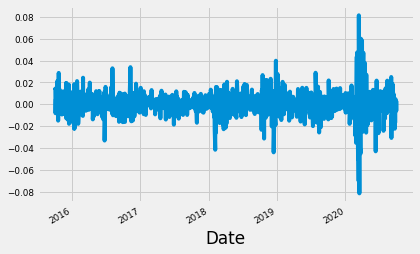

In [140]:
# Plot
Return_Stocks_2['Portfolio_Daily_Return'].plot()

It has similar result like the first combination...

In [141]:
# Cumulative return from the portfolio
Cumulative_returns_daily_2 = (1+Return_Stocks_2).cumprod()
Cumulative_returns_daily_2.tail(5)

,JNJ,RHHBY,MRK,GOOG,Portfolio_Daily_Return
Date,,,,,
2020-09-24,1.552753,1.345575,1.684221,2.336518,1.784987
2020-09-25,1.563379,1.349187,1.679765,2.363788,1.793267
2020-09-28,1.578942,1.327815,1.676322,2.395786,1.795778
2020-09-29,1.578405,1.305539,1.658902,2.403655,1.784903
2020-09-30,1.597939,1.288682,1.680170,2.404096,1.790466


<AxesSubplot:xlabel='Date'>

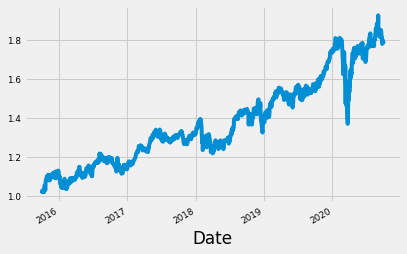

In [142]:
Cumulative_returns_daily_2['Portfolio_Daily_Return'].plot()

In [143]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.
covariance_portfolio_2 = Return_Stocks_2.iloc[:,:-1]
covariance_portfolio_2 = (covariance_portfolio_2.cov())*252

covariance_portfolio_2

,JNJ,RHHBY,MRK,GOOG
JNJ,0.039117,0.019560,0.025844,0.023301
RHHBY,0.019560,0.046023,0.020306,0.023277
MRK,0.025844,0.020306,0.049865,0.023880
GOOG,0.023301,0.023277,0.023880,0.068777


In [144]:
# Applying the matrix operations mentioned in the image above
portfolio_variance_2 = np.dot(Patrick_Weights.T,np.dot(covariance_portfolio_2, Patrick_Weights))
portfolio_variance_2

0.029757499642478664

In [145]:
# Standard deviation (risk of portfolio)
portfolio_risk_2 = np.sqrt(portfolio_variance_2)
portfolio_risk_2

0.17250362211408393

In [146]:
# Assuming that the risk free rate is zero
Sharpe_Ratio_Portfolio_2 = Return_Stocks_2['Portfolio_Daily_Return'].mean() / Return_Stocks_2['Portfolio_Daily_Return'].std()
Sharpe_Ratio_Portfolio_2

0.04804942749566462

In [147]:
Annualised_Sharpe_Ratio_2 = (252**0.5)*Sharpe_Ratio_Portfolio_2
Annualised_Sharpe_Ratio_2

0.762761014755346

In [148]:
invested_amount=500000
Cummulative_returns_2=Cumulative_returns_daily_2['Portfolio_Daily_Return'][-1]
Expected_Return_2=invested_amount*Cummulative_returns_2
Expected_Return_2

895233.0628709467

The returns are not doubled... so this combination can not be accepted eventhough has a low risk compared to previous one

# Third combination

### Let's replace the google with high risk high return stock like amazon....

In [149]:
Patrick_Portfolio_3 = ['JNJ' , 'RHHBY' , 'MRK' , 'AMZN']
Patrick_Weights_3 = np.array([0.25 , 0.25 , 0.25 , 0.25])

In [150]:
Return_Stocks_3=DR[Patrick_Portfolio_3]
Return_Stocks_3

,JNJ,RHHBY,MRK,AMZN
Date,,,,
2015-10-02,0.815715,0.301020,1.559652,2.269935
2015-10-05,0.883639,0.360141,2.173915,2.091865
2015-10-06,-1.414103,0.269139,-2.791335,-1.140379
2015-10-07,1.669883,-2.922756,2.309241,0.829802
2015-10-08,0.105284,2.150541,0.137388,-1.620111
2015-10-09,0.305007,-1.172929,-0.137199,1.245408
2015-10-12,0.650094,0.426047,-0.471054,1.924790
2015-10-13,-0.562560,0.545455,-2.445273,-0.234460
2015-10-14,-0.963853,-0.482218,0.141500,-0.741484


In [151]:
Return_Stocks_3 = Return_Stocks_3/100
Return_Stocks_3

,JNJ,RHHBY,MRK,AMZN
Date,,,,
2015-10-02,0.008157,0.003010,0.015597,0.022699
2015-10-05,0.008836,0.003601,0.021739,0.020919
2015-10-06,-0.014141,0.002691,-0.027913,-0.011404
2015-10-07,0.016699,-0.029228,0.023092,0.008298
2015-10-08,0.001053,0.021505,0.001374,-0.016201
2015-10-09,0.003050,-0.011729,-0.001372,0.012454
2015-10-12,0.006501,0.004260,-0.004711,0.019248
2015-10-13,-0.005626,0.005455,-0.024453,-0.002345
2015-10-14,-0.009639,-0.004822,0.001415,-0.007415


In [152]:
stock_risk_3 = Return_Stocks_3.std()
print(stock_risk_3)

JNJ      0.012459
RHHBY    0.013514
MRK      0.014067
AMZN     0.018969
dtype: float64


Amazon got the highest risk as expected

In [154]:
# Average daily return from each stock
daily_returns_mean_3 = Return_Stocks_3.mean()
print(daily_returns_mean_3)

JNJ      0.000451
RHHBY    0.000293
MRK      0.000511
AMZN     0.001611
dtype: float64


Amazon has a good mean compared to others....

In [155]:
# Total Portfolio Return - Store the reults in "portfolio_return"
allocated_daily_returns_3 = (Patrick_Weights * daily_returns_mean_3)
portfolio_return_3 = np.sum(allocated_daily_returns_3)
print(portfolio_return_3)

0.0007162464502987454


In [156]:
# Portfolio daily returns
Return_Stocks_3['Portfolio_Daily_Return'] = Return_Stocks_3.dot(Patrick_Weights)
Return_Stocks_3.tail(5)

,JNJ,RHHBY,MRK,AMZN,Portfolio_Daily_Return
Date,,,,,
2020-09-24,0.001592,-0.003567,0.006293,0.006644,0.002741
2020-09-25,0.006843,0.002685,-0.002646,0.024949,0.007958
2020-09-28,0.009955,-0.015841,-0.002050,0.025498,0.004390
2020-09-29,-0.000340,-0.016776,-0.010391,-0.009190,-0.009174
2020-09-30,0.012376,-0.012912,0.012820,0.001224,0.003377


<AxesSubplot:xlabel='Date'>

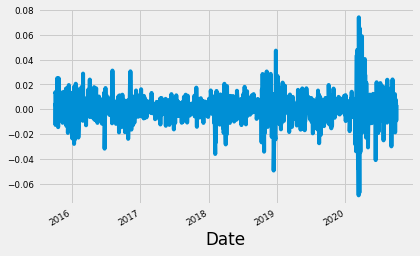

In [157]:
# Plot
Return_Stocks_3['Portfolio_Daily_Return'].plot()

In [158]:
# Cumulative return from the portfolio
Cumulative_returns_daily_3 = (1+Return_Stocks_3).cumprod()
Cumulative_returns_daily_3.tail(5)

,JNJ,RHHBY,MRK,AMZN,Portfolio_Daily_Return
Date,,,,,
2020-09-24,1.552753,1.345575,1.684221,5.799259,2.272007
2020-09-25,1.563379,1.349187,1.679765,5.943943,2.290087
2020-09-28,1.578942,1.327815,1.676322,6.095503,2.300142
2020-09-29,1.578405,1.305539,1.658902,6.039484,2.279039
2020-09-30,1.597939,1.288682,1.680170,6.046878,2.286736


<AxesSubplot:xlabel='Date'>

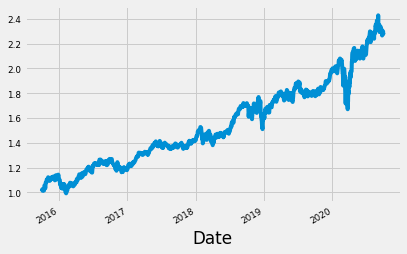

In [159]:
Cumulative_returns_daily_3['Portfolio_Daily_Return'].plot()

In [160]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.
covariance_portfolio_3 = Return_Stocks_3.iloc[:,:-1]
covariance_portfolio_3 = (covariance_portfolio_3.cov())*252

covariance_portfolio_3

,JNJ,RHHBY,MRK,AMZN
JNJ,0.039117,0.019560,0.025844,0.019497
RHHBY,0.019560,0.046023,0.020306,0.021094
MRK,0.025844,0.020306,0.049865,0.017194
AMZN,0.019497,0.021094,0.017194,0.090671


In [161]:
# Applying the matrix operations mentioned in the image above
portfolio_variance_3 = np.dot(Patrick_Weights.T,np.dot(covariance_portfolio_3, Patrick_Weights))
portfolio_variance_3

0.029541725473596767

In [162]:
# Standard deviation (risk of portfolio)
portfolio_risk_3 = np.sqrt(portfolio_variance_3)
portfolio_risk_3

0.17187706500169464

In [163]:
# Assuming that the risk free rate is zero
Sharpe_Ratio_Portfolio_3 = Return_Stocks_3['Portfolio_Daily_Return'].mean() / Return_Stocks_3['Portfolio_Daily_Return'].std()
Sharpe_Ratio_Portfolio_3

0.06615228104708133

In [164]:
Annualised_Sharpe_Ratio_3 = (252**0.5)*Sharpe_Ratio_Portfolio_3
Annualised_Sharpe_Ratio_3

1.0501349058613723

In [165]:
invested_amount=500000
Cummulative_returns_3=Cumulative_returns_daily_3['Portfolio_Daily_Return'][-1]
Expected_Return_3=invested_amount*Cummulative_returns_3
Expected_Return_3

1143367.8154190835

### The third combination of Johnson_and_Johnson(JNJ) , Roche_Holding(RHHBY) , Merck_and_CO(MRK) and Amazon(AMZN) has higher returns 1143367.8 and a portfolio risk of 17.18%...

# Mr. Peter Portfolio

### Mr. Peter Jyengar wants to invest complete one million dollars in stock market and does not care about risk but wants high returns. We can select high return stocks like Amazon and Microsoft... We can even choose  even a single stock like amazon but it is always recomended to invest in multiple stocks than a single stock....So, Let's go with Amazon and Microsoft...

In [172]:
Peter_Portfolio = ['MSFT', 'AMZN']
Peter_Weights = np.array([0.5 , 0.5 ])

In [173]:
Return_Stocks_P= DR[Peter_Portfolio]
Return_Stocks_P

,MSFT,AMZN
Date,,
2015-10-02,2.151982,2.269935
2015-10-05,2.326094,2.091865
2015-10-06,0.257343,-1.140379
2015-10-07,0.106950,0.829802
2015-10-08,1.388893,-1.620111
2015-10-09,-0.716544,1.245408
2015-10-12,-0.233498,1.924790
2015-10-13,-0.234045,-0.234460
2015-10-14,-0.447855,-0.741484


In [174]:
Return_Stocks_P = Return_Stocks_P/100
Return_Stocks_P

,MSFT,AMZN
Date,,
2015-10-02,0.021520,0.022699
2015-10-05,0.023261,0.020919
2015-10-06,0.002573,-0.011404
2015-10-07,0.001069,0.008298
2015-10-08,0.013889,-0.016201
2015-10-09,-0.007165,0.012454
2015-10-12,-0.002335,0.019248
2015-10-13,-0.002340,-0.002345
2015-10-14,-0.004479,-0.007415


In [175]:
stock_risk_P = Return_Stocks_P.std()
print(stock_risk_P)

MSFT    0.017539
AMZN    0.018969
dtype: float64


In [177]:
# Average daily return from each stock
daily_returns_mean_P = Return_Stocks_P.mean()
print(daily_returns_mean_P)

MSFT    0.001387
AMZN    0.001611
dtype: float64


In [179]:
# Total Portfolio Return - Store the reults in "portfolio_return"
allocated_daily_returns_P = (Peter_Weights * daily_returns_mean_P)
portfolio_return_P = np.sum(allocated_daily_returns_P)
print(portfolio_return_P)

0.001498788745701871


In [180]:
# Portfolio daily returns
Return_Stocks_P['Portfolio_Daily_Return'] = Return_Stocks_P.dot(Peter_Weights)
Return_Stocks_P.tail(5)

,MSFT,AMZN,Portfolio_Daily_Return
Date,,,
2020-09-24,0.012962,0.006644,0.009803
2020-09-25,0.022787,0.024949,0.023868
2020-09-28,0.007795,0.025498,0.016647
2020-09-29,-0.010409,-0.009190,-0.009799
2020-09-30,0.014812,0.001224,0.008018


<AxesSubplot:xlabel='Date'>

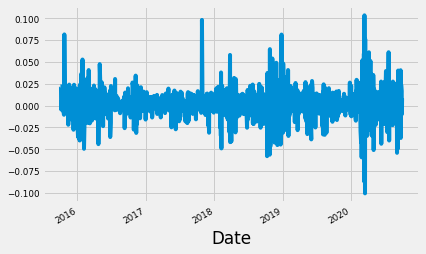

In [181]:
# Plot
Return_Stocks_P['Portfolio_Daily_Return'].plot()

Major fluctuations have happened in 2017,2019 and 2020

In [182]:
# Cumulative return from the portfolio
Cumulative_returns_daily_P = (1+Return_Stocks_P).cumprod()
Cumulative_returns_daily_P.tail(5)

,MSFT,AMZN,Portfolio_Daily_Return
Date,,,
2020-09-24,4.554808,5.799259,5.316747
2020-09-25,4.658597,5.943943,5.443646
2020-09-28,4.694911,6.095503,5.534264
2020-09-29,4.646043,6.039484,5.480031
2020-09-30,4.714862,6.046878,5.523972


<AxesSubplot:xlabel='Date'>

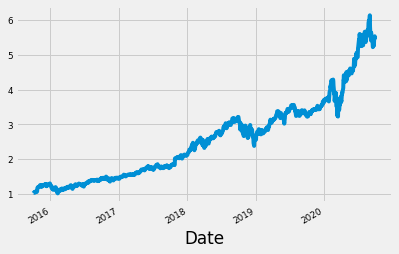

In [183]:
Cumulative_returns_daily_P['Portfolio_Daily_Return'].plot()

In [184]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.
covariance_portfolio_P = Return_Stocks_P.iloc[:,:-1]
covariance_portfolio_P = (covariance_portfolio_P.cov())*252

covariance_portfolio_P

,MSFT,AMZN
MSFT,0.077524,0.056626
AMZN,0.056626,0.090671


In [185]:
# Applying the matrix operations mentioned in the image above
portfolio_variance_P = np.dot(Peter_Weights.T,np.dot(covariance_portfolio_P, Peter_Weights))
portfolio_variance_P

0.07036153899689972

In [186]:
# Standard deviation (risk of portfolio)
portfolio_risk_P = np.sqrt(portfolio_variance_P)
portfolio_risk_P

0.2652574956469651

In [187]:
# Assuming that the risk free rate is zero
Sharpe_Ratio_Portfolio_P = Return_Stocks_P['Portfolio_Daily_Return'].mean() / Return_Stocks_P['Portfolio_Daily_Return'].std()
Sharpe_Ratio_Portfolio_P

0.08969599021383841

In [188]:
Annualised_Sharpe_Ratio_P = (252**0.5)*Sharpe_Ratio_Portfolio_P
Annualised_Sharpe_Ratio_P

1.423879702232998

In [189]:
invested_amount_P=1000000
Cummulative_returns_P=Cumulative_returns_daily_P['Portfolio_Daily_Return'][-1]
Expected_Return_P=invested_amount_P*Cummulative_returns_P
Expected_Return_P

5523971.805773485

### At a portfolio risk of 26.5, Mr. Peter will get returns of  5523971.8.... That will be the best match for him....

# Conclusion

### Mr. Patrick Jyengar is recommended a portfolio containing Johnson_and_Johnson(JNJ) , Roche_Holding(RHHBY) , Merck_and_CO(MRK) and Amazon(AMZN) with returns 1143367.8 and a portfolio risk of 17.18.

### Mr. Peter Jyengar is recommended a portfolio containing Microsoft(MSFT) and Amazon(AMZN) with returns 5523971.8 and a risk of 26.5. 